# Table Of Contents

- [Phase 1](#phase-1)
- [Importing the libraries](#importing-the-libraries)
  * [Challenge Idea](#challenge-idea)
  * [Domain Understanding](#domain-understanding)
  * [WWWWH](#wwwwh)
    + [What is this project, and what are the benefits of it?](#what-is-this-project--and-what-are-the-benefits-of-it-)
    + [What are the downsides?](#what-are-the-downsides-)
    + [Why a movie recommendation system?](#why-a-movie-recommendation-system-)
    + [Who is this for?](#who-is-this-for-)
    + [When?](#when-)
    + [How will this be achieved?](#how-will-this-be-achieved-)
- [Expert Interview](#expert-interview)
  * [Questions](#questions)
  * [Responses](#responses)
- [Target Demographic and Vision for this Application](#target-demographic-and-vision-for-this-application)
- [TICT Quick Scan](#tict-quick-scan)
- [Analytic Approach](#analytic-approach)
- [Phase 2: Provisioning](#phase-2--provisioning)
- [Data Requirements](#data-requirements)
- [Data Sourcing](#data-sourcing)
  * [Data Collection](#data-collection)
- [Importing Data](#importing-data)
- [Deleting the created movies dataframe for memory management](#deleting-the-created-movies-dataframe-for-memory-management)
- [Data Preparation](#data-preparation)
- [Phase 3](#phase-3)
- [Collaborative Filtering](#collaborative-filtering)
  * [Preprocessing](#preprocessing)
  * [Modelling](#modelling)
  * [Results](#results)
  * [Summary](#summary)
- [Content Based Filtering](#content-based-filtering)
- [Preprocessing](#preprocessing-1)
- [Modeling](#modeling)
  * [Summary](#summary-1)
- [Hybrid System](#hybrid-system)
- [Re-importing the dataframes](#re-importing-the-dataframes-1)
  * [Preprocessing](#preprocessing-2)
  * [Dimensionality Reduction with Principal Component Analysys (PCA)](#dimensionality-reduction-with-principal-component-analysys--pca-)
        * [Advantages:](#advantages-)
        * [Disadvantages:](#disadvantages-)
- [Transform the result to a dataframe](#transform-the-result-to-a-dataframe)
  * [K-Means Clustering](#k-means-clustering)
    + [Figuring out the correct K-value](#figuring-out-the-correct-k-value)
    + [The Elbow Method](#the-elbow-method)
    + [The Silhouette Coefficient](#the-silhouette-coefficient)
    + [How these functions work](#how-these-functions-work)
- [Calculating optimal K-value using the Elbow Method](#calculating-optimal-k-value-using-the-elbow-method)
- [Calculating optimal K-value using the Silhouette Method](#calculating-optimal-k-value-using-the-silhouette-method)
  * [Visualizing the calculations of the Elbow and Silhouette Coefficient](#visualizing-the-calculations-of-the-elbow-and-silhouette-coefficient)
  * [Modeling](#modeling-1)
    + [Training K-means](#training-k-means)
    + [Cluster Visualization](#cluster-visualization)
    + [Text Vectorization](#text-vectorization)
  * [Training Cosine Similarity](#training-cosine-similarity)
  * [Results](#results-1)
  * [Evaluation](#evaluation)
    + [Results](#results-2)
  * [Summary](#summary-2)
- [Model-Based Filtering using Singular Value Decomposition (SVD)](#model-based-filtering-using-singular-value-decomposition--svd-)
  * [Preprocessing](#preprocessing)
    + [SVD Set-up](#svd-set-up)
    + [Getting predictions from decomposed matrix](#getting-predictions-from-decomposed-matrix)
  * [Evaluation](#evaluation-1)
    + [Experimental](#experimental)


## Changelog

##### 20-04
- Updated Documentation in Phase 1 and 2
- Introduced [TOC](#table-of-contents)
- Fixed the counterplot in Phase 2
- Added a new whitegrid plot
- Added Changelog section
- Added Data Preparation Section
- Fixed some typos
- Filled in info about the TD-IDF Vectorizer

##### 24-04
- Started work on SVD Model
- Started work on Clustering Model

##### 26-04
- Finished implementing Clustering
- Moved some imports back to [Phase 1](#importing-the-libraries)
- Finished implementing SVD

##### 27-04
- Updated documentation

##### 28-04
- Updated documentation

##### 03-05
- Finished Phase 3 documentation
- Polished Phase 2 documentation
- Made additions to Phase 1's missing documentation
- Made some modifications to [Content Filtering's](#content-based-filtering) hyperparameter tuning
- Made additions to EDA

##### 09-05 - 11-05 (Post Rens discussion and peer reviews)
- Added Feedback in the [Target Demographic](#target-demographic-and-vision-for-this-application) section and did new sketches on paper on how the finished product would look like
- Updated Analytic Approach
- Updated Data Sourcing
- Updated Data Requirements
- Implemented model transparency for the TF-IDF vectorizer([Content Filtering](#content-based-filtering))


# Phase 1

<hr></hr>

# Importing the libraries

In [2]:
import pandas as pd
import numpy as np

# Data visualization packages
import seaborn as sb
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import wordcloud
from wordcloud import WordCloud, STOPWORDS
from IPython.display import display_html

# Utility packages
import gc
import re
from scipy.sparse import csr_matrix

# Modeling packages
import sklearn
from sklearn import preprocessing
from sklearn.neighbors import NearestNeighbors
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import silhouette_score
from gensim.parsing.preprocessing import remove_stopwords
from scipy.sparse.linalg import svds

# Evaluation packages
from sklearn.preprocessing import minmax_scale
from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Matplotlib inline settings
%matplotlib inline
%config InlineBackend.figure_formats = {'png', 'retina'}
plt.style.use('ggplot')

# Version printouts
print("scikit-learn version:", sklearn.__version__)     
print("pandas version:", pd.__version__)            
print("seaborn version:", sb.__version__)

scikit-learn version: 1.2.2
pandas version: 2.0.1
seaborn version: 0.12.2


## Challenge Idea

I have selected the concept of developing a `Movie Recommendation System`. My plan is to utilize the MovieLens dataset, which has been created by `GroupLens`. However, because of potential notebook performance issues and size limitations, I have chosen to use the `ml-latest-small` version of the dataset. In the future, if required, the project can be scaled up.

<hr></hr>

## Domain Understanding

Movies are a form of visual storytelling that have been a major form of entertainment and artistic expression for over a century. They are typically produced by a team of filmmakers, including a director, screenwriter, producer, and various technical crew members. Movies can be classified into various genres, such as action, romance, comedy, horror, and drama, among others. They are often released in cinemas or movie theaters, but can also be viewed at home through various mediums like DVDs, streaming services, or cable television. Movies can have a profound impact on culture and society, reflecting and shaping attitudes, beliefs, and values. They can also be a powerful medium for social commentary, political critique, and artistic expression.

Movie recommendation systems are a type of information filtering technology that aim to predict and suggest movies to users based on their viewing history, preferences, and behavior. These systems leverage machine learning algorithms, data mining techniques, and user feedback to provide personalized recommendations for movies that users are likely to enjoy. Recommendation systems can be implemented using collaborative filtering, content-based filtering, or hybrid approaches that combine the two methods. Collaborative filtering techniques use the similarities in movie ratings and preferences of different users to make recommendations, while content-based filtering techniques analyze the attributes of movies such as genre, cast, plot, and other metadata to provide recommendations. Movie recommendation systems are widely used by movie streaming services, such as Netflix, Amazon Prime Video, and Hulu, to enhance user experience and increase customer satisfaction.

Throughout this project, I will explore different ways of recommending content to a user, these methods revolve around `Collaborative Filtering`, `Content-Based Filtering` a `Hybrid System`, that aims to implement both and `Model-Based Filtering`, powered by `SVD`.

<hr></hr>

## WWWWH

### What is this project, and what are the benefits of it?

This project will be aimed at creating a movie recommendation system that is able to predict similar movies based on an input parameter, to a certain degree of accuracy. The dataset I opted to use is the MovieLens `ml-latest-small` set. This is provided by `GroupLens`, and has 100,000 ratings, 3,600 tag applications applied to 9,000 movies by 600 users.

Content providers (e.genres. music, movies) and social networking services use recommendation systems to manage content and create effective recommendations for users. The most obvious goal of a recommendation system is to recommend relevant products to the user, in our case, movies.

*`Sources:`*

*Miquido, & Holewa, K. (2023, April 14). Recommendation systems: Benefits, Types & Examples - Miquido blog. Miquido.*

*Retrieved April 14, 2023, from https://www.miquido.com/blog/perks-of-recommendation-systems-in-business/*

### What are the downsides?

One of the biggest downsides of using something like this would be a user's privacy. To be able to achieve something like User-Based Content Filtering, companies that implement these sort of recommendation features need to implement a lot of data mining features. Considering how most, if not all bit companies keep their code closed-source, you never know what data leaves your device, therefore adding a bit of a privacy risk into the picture.

### Why a movie recommendation system? 

I wanted to do this challenge because movies are something that I deeply enjoy, therefore something I'm interested in. I felt that I had good enough domain understanding for this subject, which was also a factor for my consideration.

### Who is this for?

I believe that something like this can be used not only by individuals, but potentially by other companies as a means to adding a recommendation feature on something like a streaming service, or other products.

### When?

As for the timeline, I want to stick as close to the Fontys schedule as I can. As for now, I have already submitted my iteration zero, and will continue to add weekly additions to my challenge notebook. 

### How will this be achieved?

For successfully completing this project, I will need the following things:

>A dataset that's on topic.

>Proper time management.

>Good domain understanding.

# Expert Interview

For this interview, the initial plan was to contact an industry expert, the owner of [Jason's Movie Blog](https://jasonsmovieblog.com), but I sadly didn't get any reponses. Due to this, I resorted to get in touch with one of my movie buff friends, Wyatt Southard. I asked him the same set of questions initially adressed to the blog's owner, and these were his responses.


## Questions

- 1.  How have movie recommendation systems evolved over the years, and what role does artificial intelligence play in the current state of these systems?
- 2.  Can you discuss the impact of artificial intelligence on the movie industry, including its effects on production, distribution, and marketing?
- 3.  How can movie recommendation systems account for individual preferences and biases to provide more personalized recommendations?
- 4.  What challenges do movie recommendation systems face when recommending content to users, and how are these challenges being addressed by industry experts?
- 5.  How does the use of artificial intelligence in the movie industry affect the creative process, and what are some potential risks and benefits?
- 6.  How do movie recommendation systems impact consumer behavior, including how they choose what movies to watch and how they perceive certain genres or themes?
- 7.  How does the use of artificial intelligence in movie marketing and distribution differ from traditional marketing and distribution strategies, and what advantages does it offer?
- 8.  How do you envision the future of the movie industry with the continued development and integration of artificial intelligence?

## Responses

- 1: I don’t quite know the details, but I know they have become more personalized based off what people already have watched. I am using Netflix as a reference because I know their system can even generate personal categories of movies for you to watch based on what it thinks you like.
- 2: As far as production goes, the world is already seeing how well AI can generate images so it will probably improve CGI overall and make animated movies hella better. As far as distribution and marketing goes, AI could flood the internet with ads for movies I guess.
- 3: They can consider what movies were watched, how many times a movie was watched, how long until the user clicked off the movie, the genre of movie watched, etc.
- 4: One problem could be determining the individual user, multiple people could use the same account for watching movies so it would be hard to determine who is who. As far as how it is being addressed, Netflix is trying to get rid of password sharing, which has a potential of trigerring a lot of this behavior in the industry.
- 5: It could overall speed up the process of editing scenes and producing the movie. A benefit would be less time spent working on the movie and a risk could be someone could be out of a job. 
- 6: Movies being recommended to the user will more likely be watched. They can spend less time searching for movies and also find movies in the same genre that they enjoy. 
- 7: I am not sure about this one but I can say that with AI they can reach more people faster. 
- 8: In the future, movies will take less than a year to produce. I see a world where the AI does practically everything from writing the movie to casting the characters to only needed single takes of scenes because they can fix whatever doesn’t work. Movies will not only have new actors/actresses but old ones that have long been dead because they will be able to recreate them. 

# Target Demographic and Vision for this Application

The intended user base for this application are all movie watchers that want or require recommendations for potential movies they'd like to watch. An easy way that this could be integrated would be a web application with access to the trained models and datasets, that's able to pick between different `Content Filtering` methods, or `all methods`, and give results on screen. This is my vision for the final form of this application. To be able to easily visualize it, I made this prototype

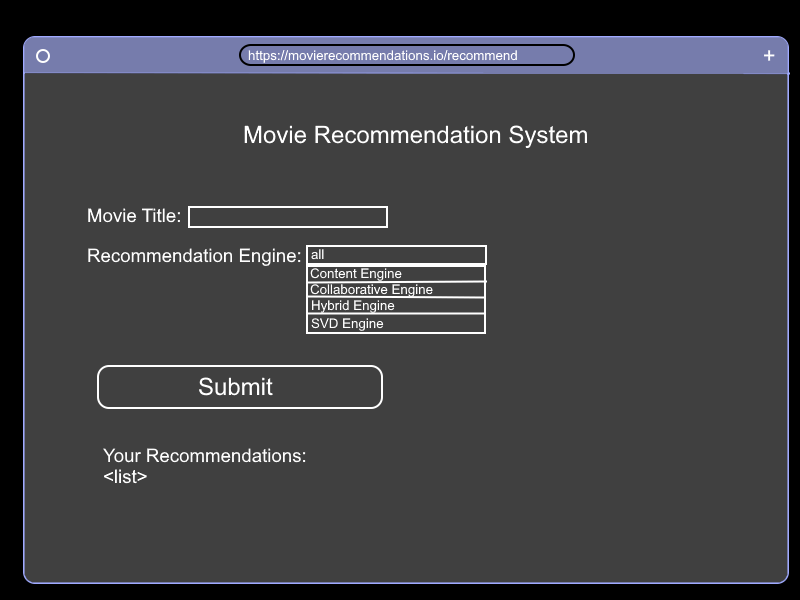

After this first iteration, I proceeded to ask friends and family that were interested in this project and topic for feedback on what they would like to see in the finalized version of this application.

**Disclaimer: Since most of these feedback documents were sent to me in my native language, I have taken the liberty of translating them into English.**

##### Ștefan Roșculeț:
- More explanations when it comes to the filtering methods
  - There isn't anything mentioned for a user that hasn't read the project reader, therefore not a lot of information
  - Basically create an about section where you can go in depth as for what to use and when.

##### Cojocaru Andrei:
-  More colors in order to make it more lively.
-  Add an image of the movie poster to the right when you click on a movie.
-  A similarity percentage instead of algorithm results. Maybe a Netflix-like match system.
-  Change the fonts.  
##### David Hogea:
- I'd like to see a separate page where you go in depth with explaining the algorithms or filtrering engines and the individual filters that you can use for recommendations.

##### Yannick de Boer:
- You are currently listing all recommendations as a list of movie titles. I am assuming that is in part due to the limitations of your dataset. In the future, would it not be nicer to have a cover art for each recommended movie being displayed?
- There is a recommendation engine selection field, but will this really be relevant to the end-user?
- Would it not be better to simply have all engines run, and have separate lists of recommendations for each engine?
- Right now, you are expecting a movie title to be entered. This will work for the purpose of a proof-of-concept, but is rather clunky in practice.
- Maybe have a list of genres that the user can choose of first, and then let the user select one movie from a number of iconic/well-known movies fitting (one of) those genres?
- Allow the user to reload this list, and also add some lesser known/not as highly regarded picks for diversity.
- There is a lack of filtering options (year, studio, etc.). This would be a nice feature to have.
- Maybe incorporate a feature that allows the user to re-run the algorithm to get a set of different movies?
- A feature that would allow the user to exclude movies they already watched would prevent users from getting recommendations they don't need.
- Incidentally, this could be re-used to recommend movies that the user already watched, that they may want to watch again in a separate list.

##### Cătalina Davidoiu:
- I would like to see a list with the highest rated movies from the last quarter
- I would like to be able to to choose something like an actor from a movie, for a more taliored movie recommendation.
- List that shows the best movies from a genre.
- List of highly rated movies.
- Nice interface.
- Movie descriptions (if available).

##### Ciprian Davidoiu:
- It would be pretty cool to have something like a chatroom, either with other people or powered by AI, where you could chat and ask for for another recommendation opinion.
- I'd like to see other user reviews on recommended movies.
- I'd like for the movies to be updated regularly I'd like a top of movies that have been recommended to the users site-wide.

##### Raluca Negoescu:
- Accessible from a local home network.
- I'd like to be able to fine-tune recommendations based on the year of a movie, for example, setting a target for the system to recommend movies from the 1980's and below.
- A different page with a full list of movies currently available for predictions:
  - Color coded categories for movie genre categories.
  - Icons next to said categories.
  - Recommendations already available whenever you click on a movie from a category.
  - Ability to filter after years.
  - Filter after actors.
- Easy to use interface.
- I'd like to have access to a list of top rated movies.
- I'd like users to be able to post comments on individual movies, so when I'm making a choice as to what movie to watch next, I can also base my choice on not only the system, but also other user's reviews.
- Movies should have a short description whenever they're clicked on.

##### Robert Negoescu:
- Make every recommendation clickable.
- Display movie poster upon clicking.
- List of ratings.
- Filter after movies.
- Filter on a movie is black or white.
- Filter after movie duration.


Following this feedback, I continued by making sketches that implement the feedback I was able to receive from my contacts, and these were the results. 

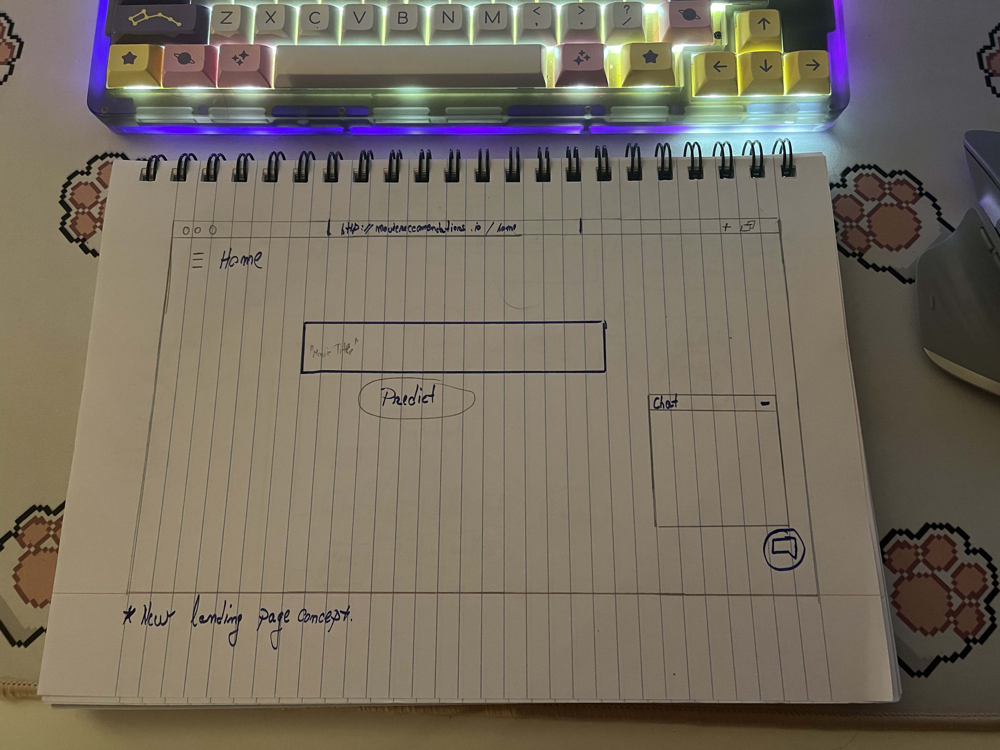

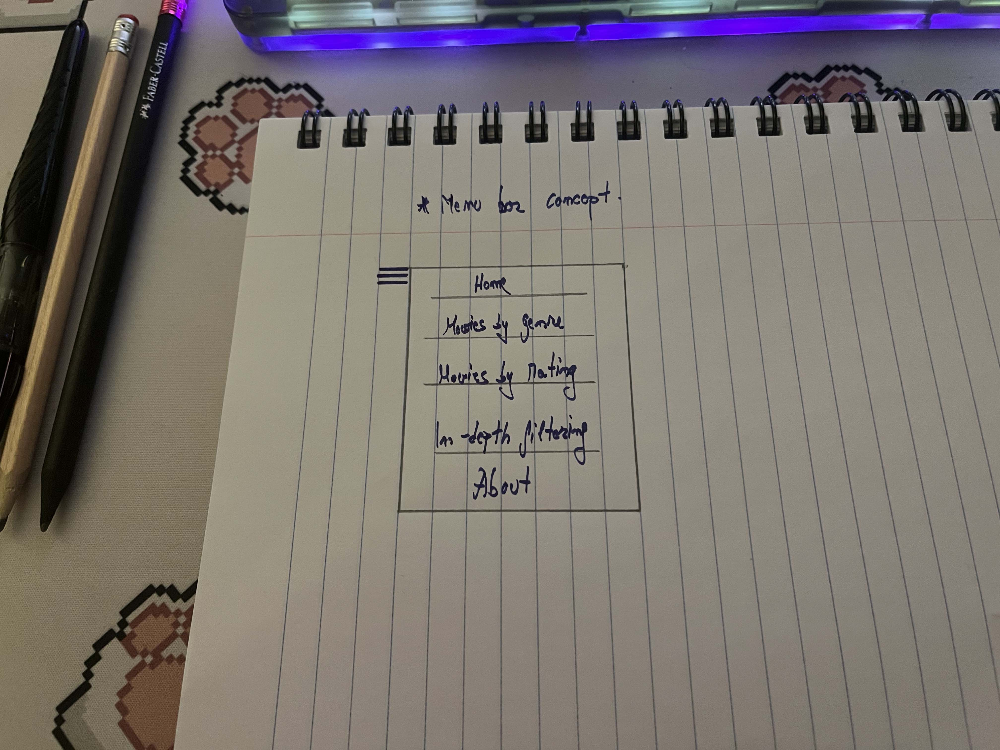

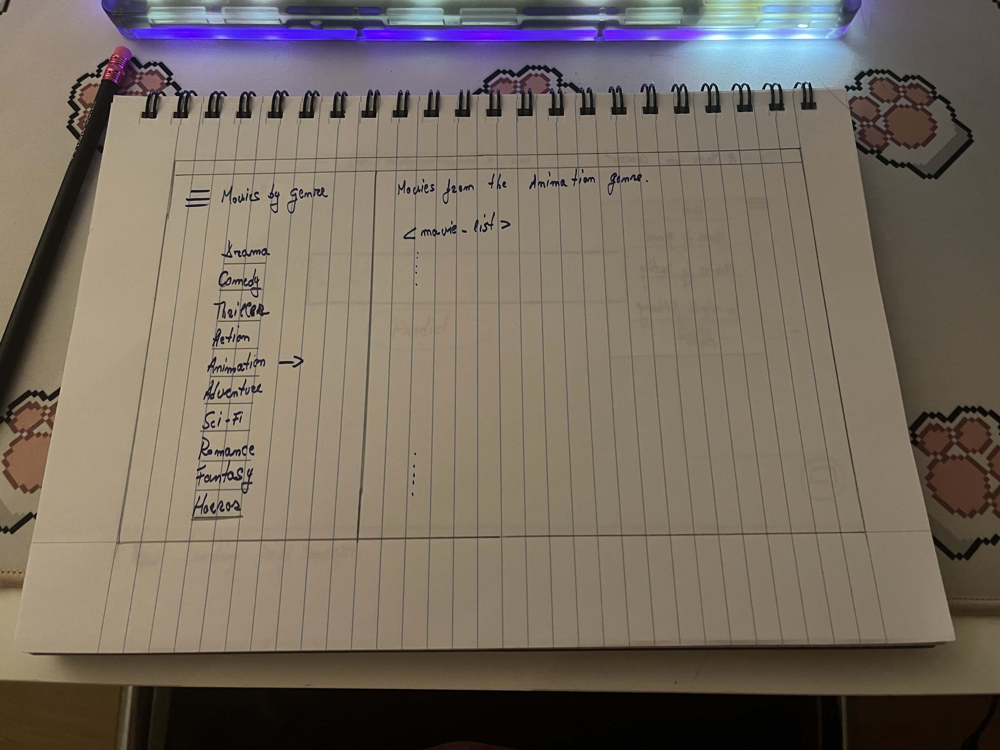

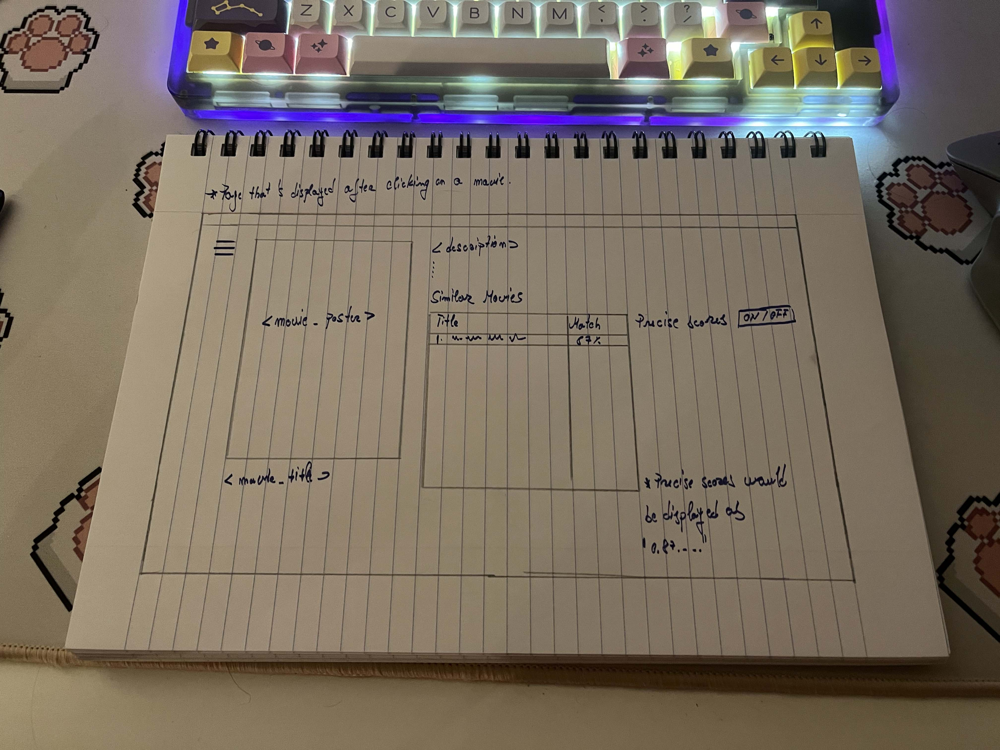

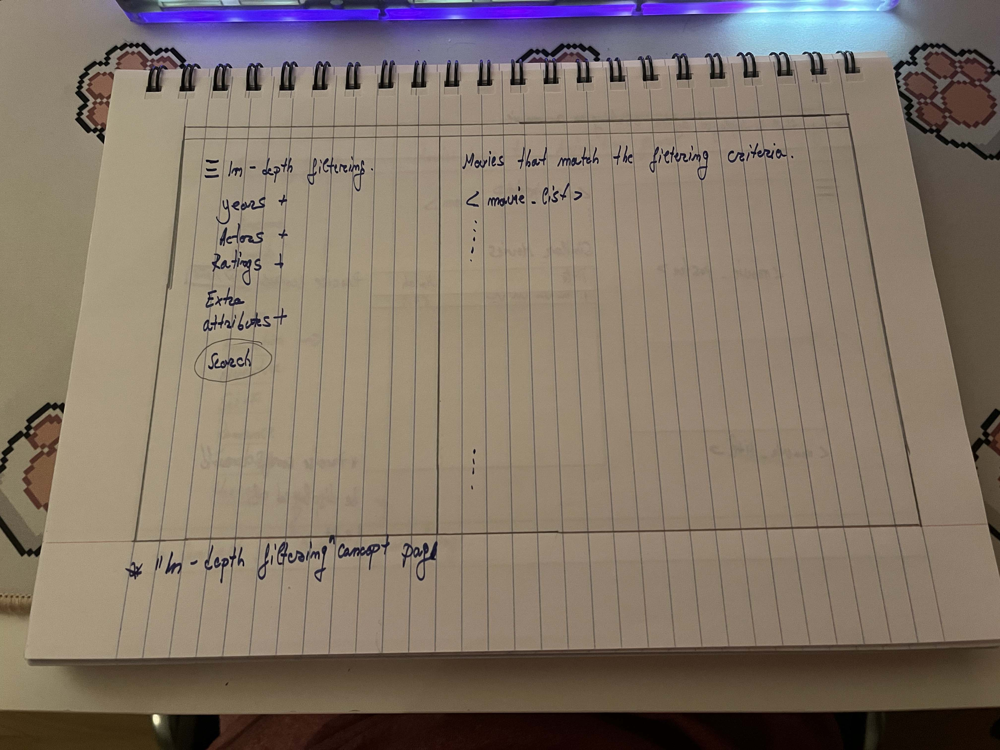

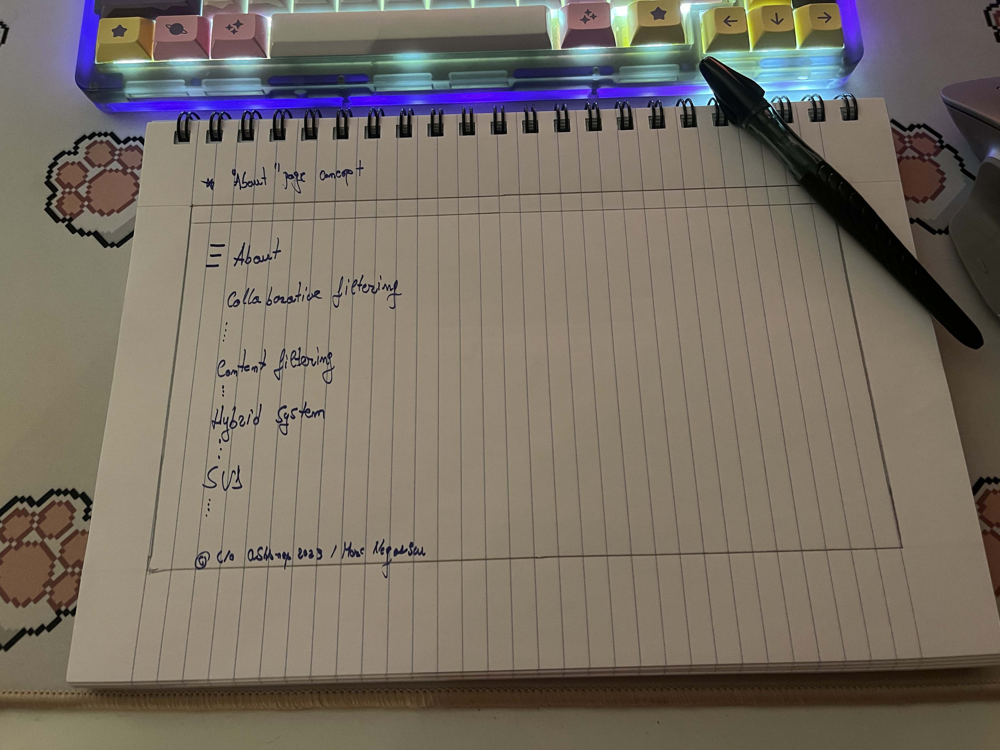

Many of the requested features by these potential users are possible to implement in the real world. There are potential issues that could be caused by the `lack of data` in the datasets currently at my disposal, but purely from a information display standpoint, you could probably employ the use of the [IMDb API](https://developer.imdb.com) alongside other good movie database services in order to display information like `movie posters`, `short descriptions` and `other missing data` that can be scraped using said API.

Furthermore, I believe it's possible to use the [Data Scraping](https://www.imperva.com/learn/application-security/data-scraping/#:~:text=Data%20scraping,%20or%20web%20scraping,the%20data%20on%20other%20websites.) technique in order to futher improve the flux of data, and overall data points in the datasets. Information such as `Actors`, `Box Office Earnings`, `Director` and `Year` could be `scraped` off a database such as `IMDb` and added to the datasets and then cleaned. However this is quite a tedious process, and by doing this you might introduce inconsistencies or erorrs in the dataset, which will lead to problems with overall algoritm accuracy.

The other requested features stand in the areas of design and rating-based recommendations, which can be implemented pretty easily, with enough time and resources.


# TICT Quick Scan

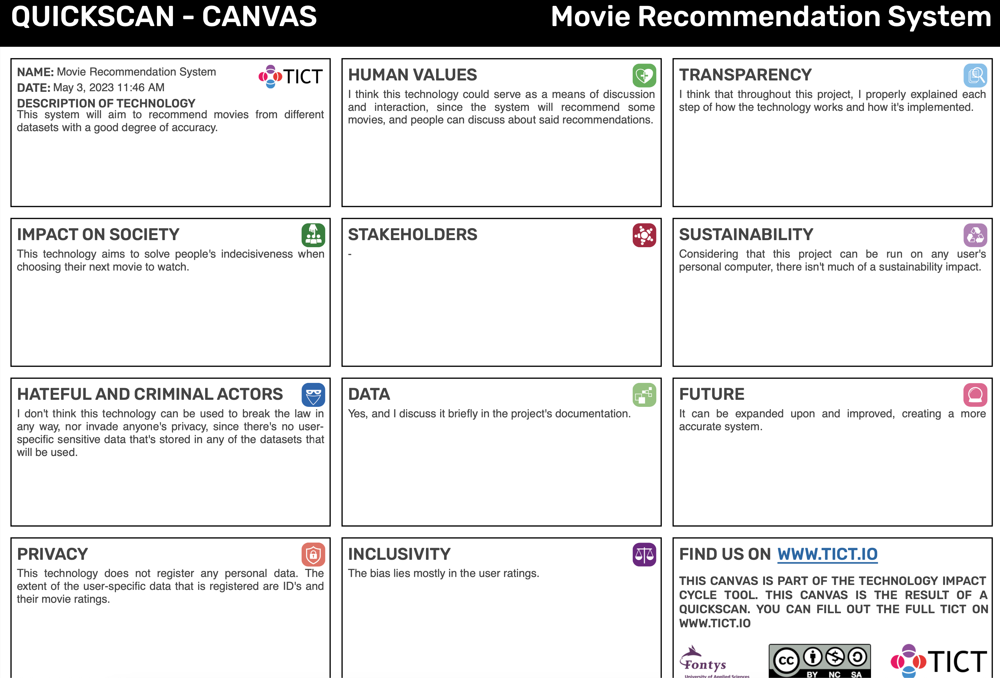

# Data Sourcing

As stated in the [Challenge Idea](#challenge-idea) part, we will be using MovieLens' [ml-latest-small](https://grouplens.org/datasets/movielens/), and [ml-latest](https://grouplens.org/datasets/movielens/) sets. GroupLens is a research lab in the Department of Computer Science and Engineering at the University of Minnesota, Twin Cities specializing in recommender systems, online communities, mobile and ubiquitous technologies, digital libraries, and local geographic information systems. My main reasoning behind chosing this specific set was because it's a set curated by industry experts, therefore giving us accurate data to work with.

Considering that this `data` is `user-tagged`, as per the explanations on the [GroupLens](https://grouplens.org/datasets/movielens/) website, even with `extensive expert-input`, there is no guarantee that all `bias` can be removed from the source data. While I don't believe that `tags` have a particularily large induced bias, it can definitely be argued that `ratings` can have a larger bias than the former. This however, will not be a massive issue for us, since the tags and ratings are applied by `600 and 1100 users` for [ml-latest-small](https://grouplens.org/datasets/movielens/) and [ml-latest](https://grouplens.org/datasets/movielens/) sets respectively. This being said, I think the number of users that have tagged this data `aleviate most of the bias` that could otherwise be introduced.

# Analytic Approach

This project will mainly focus on `recommending movies based on the title of a given movie`, therefore our `target variable` will be `title` for the `Collaborative, Content and Hybrid Systems`. When it comes to the `SVD` approach, we'll be targetting the `rating` variable for our predicions. 

With this information, we fan focus our attention on that the algorithms we'll be using to make said predictions will be [KNN (K Nearest Neighbors)](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html) for `Collaborative Filtering`. In `Content Filtering's` case we'll be using [Cosine Similariy](https://scikit-learn.org/stable/modules/metrics.html) and the [TF-IDF Vectorizer](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html). When it comes to the `Hybrid System`, we'll be mainly be focusing on [Clustering](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html). Finally, in `SVD's` case, we'll be mainly using the [SVD](https://surprise.readthedocs.io/en/stable/matrix_factorization.html) algorithm itself.

# Phase 2: Provisioning

<hr></hr>

# Data Requirements

In order to build the `recommendation engines` that are part of this project, we will need to find data that, at a high level, can stand as the basis for said `engines`. For this, I would like to have at a base level, at least access to the following fearures:
- `movie titles`
- `genres`
- `ratings`
- `tags`
As we'll shortly see in the [Data Understanding](#data-understanding) section of this notebook, both the [ml-latest-small](https://grouplens.org/datasets/movielens/) and [ml-latest](https://grouplens.org/datasets/movielens/) datasets present these features, thus being the perfect candidate to build the baseline for the `recommendation engines`.

Furthermore, in the next iterations of this project, it would be possible to add more `features` to the sets, in order to satisfy `real-life needs of users`. After the feedback received in the [Target Demographic and Vision for this Application](#target-demographic-and-vision-for-this-application), some of the `data` we'd like to have in the `datasets` would be as follows:
- `actors`
- `director`
- `year`
- `country`
- `black or white`
- `box office earnings`
- `expanded ratings` such as `ratings` from big movie databases like:
  - `Rottern Tomatoes`
  - `Metacritic`
  - `IMDb`
- `budget`

All of the features mentioned above could serve as a real-life example of the next path to take in order to expand upon this project and make it into a real-life product that can help to serve and satisfy it's users.

There are already some candidates for datasets that can be used to merge into the current sets we will be using throughout this project, those being [The Movies Dataset](https://www.kaggle.com/datasets/rounakbanik/the-movies-dataset?select=ratings_small.csv) and [IMDB Movies Dataset](https://www.kaggle.com/datasets/harshitshankhdhar/imdb-dataset-of-top-1000-movies-and-tv-shows). The indentifiable downsides that are keeping us from already adding and merging these two sets into the project are a general incompatibility from `movieId-movieId`. However, there are a lot of upsides, since these two sets manage to `achieve to get most of the data` that would otherwise be required to create the envisioned product by the number of real-world users from which I have received feedback. In the future, once the linking of all the datasets are figured out, there's definitely a possibility for expansion. Throughout the [Data Collection](#data-collection) step, I will discuss how this data can be updated in the future, and how it can be further maintained.

## Data Collection

Further updating of this data could be achieved in a few different ways. One way would be to employ most of the points made at the end of the [Target Demographic and Vision For This Application](#target-demographic-and-vision-for-this-application). By employing `data scraping techniques`, much of the missing data can be `added and linked` to the existing datasets. By tapping into different, publicly available movie databases, such as [IMDb](https://developer.imdb.com), [Metacritic](https://rapidapi.com/Prastiwar/api/metacriticapi) and [Rottern Tomatoes](https://developer.fandango.com/rotten_tomatoes), we can ensure we'll have a good influx of data, that is both expert and user reviewed, while also gaining access to a lot more informations about the source movies in general, thus allowing us to use more data in the recommendation systems, which in turns allows us to make more accurate and targetted recommendations towards an individual user. 

For updating this data, there is a possibility of building a separate script that scrapes the data mentioned above, updates the datasets and retrains the models. This way, we can ensure that we get a steady influx of quality data in our project, and a nice display in the finished product, thus giving us the ability to have an almost autonomus recommendation system.

By following this route, data bias questions may arise, though we already touched on those at a surface level in the [Data Sourcing](#data-sourcing) section.

Next up, we'll be looking at the data currently at our disposal.

We'll start off with loading the `.csv` files into memory and displaying their contents.

In [2]:
# Importing Data

ratings = pd.read_csv("./assets/ml-latest-small/ratings.csv")
movies = pd.read_csv("./assets/ml-latest-small/movies.csv")
tags = pd.read_csv("./assets/ml-latest-small/tags.csv")


In [3]:
ratings

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931
...,...,...,...,...
100831,610,166534,4.0,1493848402
100832,610,168248,5.0,1493850091
100833,610,168250,5.0,1494273047
100834,610,168252,5.0,1493846352


In [4]:
movies

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
9737,193581,Black Butler: Book of the Atlantic (2017),Action|Animation|Comedy|Fantasy
9738,193583,No Game No Life: Zero (2017),Animation|Comedy|Fantasy
9739,193585,Flint (2017),Drama
9740,193587,Bungo Stray Dogs: Dead Apple (2018),Action|Animation


In [5]:
tags

,userId,movieId,tag,timestamp
0,2,60756,funny,1445714994
1,2,60756,Highly quotable,1445714996
2,2,60756,will ferrell,1445714992
3,2,89774,Boxing story,1445715207
4,2,89774,MMA,1445715200
...,...,...,...,...
3678,606,7382,for katie,1171234019
3679,606,7936,austere,1173392334
3680,610,3265,gun fu,1493843984
3681,610,3265,heroic bloodshed,1493843978


Next up, we'll be merging our dataframes together. For this, we'll be using [pandas' merge()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.merge.html) function. This function is a little limiting, so to combat these limitations, we'll first merge the `movies` and `tags` sets, while saving that dataframe into a new one called `init_merged_df`, that we'll use afterwards for merging with the `ratings` dataframe.

In [6]:
init_merged_df = pd.merge(movies, tags, on="movieId", how="left")
init_merged_df

,movieId,title,genres,userId,tag,timestamp
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,336.0,pixar,1.139046e+09
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,474.0,pixar,1.137207e+09
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,567.0,fun,1.525286e+09
3,2,Jumanji (1995),Adventure|Children|Fantasy,62.0,fantasy,1.528844e+09
4,2,Jumanji (1995),Adventure|Children|Fantasy,62.0,magic board game,1.528844e+09
...,...,...,...,...,...,...
11848,193581,Black Butler: Book of the Atlantic (2017),Action|Animation|Comedy|Fantasy,NaN,NaN,NaN
11849,193583,No Game No Life: Zero (2017),Animation|Comedy|Fantasy,NaN,NaN,NaN
11850,193585,Flint (2017),Drama,NaN,NaN,NaN
11851,193587,Bungo Stray Dogs: Dead Apple (2018),Action|Animation,NaN,NaN,NaN


In [7]:
final_df = pd.merge(init_merged_df, ratings, on=["movieId", "userId"], how="left")
final_df

,movieId,title,genres,userId,tag,timestamp_x,rating,timestamp_y
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,336.0,pixar,1.139046e+09,4.0,1.122227e+09
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,474.0,pixar,1.137207e+09,4.0,9.785758e+08
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,567.0,fun,1.525286e+09,3.5,1.525286e+09
3,2,Jumanji (1995),Adventure|Children|Fantasy,62.0,fantasy,1.528844e+09,4.0,1.528844e+09
4,2,Jumanji (1995),Adventure|Children|Fantasy,62.0,magic board game,1.528844e+09,4.0,1.528844e+09
...,...,...,...,...,...,...,...,...
11848,193581,Black Butler: Book of the Atlantic (2017),Action|Animation|Comedy|Fantasy,NaN,NaN,NaN,NaN,NaN
11849,193583,No Game No Life: Zero (2017),Animation|Comedy|Fantasy,NaN,NaN,NaN,NaN,NaN
11850,193585,Flint (2017),Drama,NaN,NaN,NaN,NaN,NaN
11851,193587,Bungo Stray Dogs: Dead Apple (2018),Action|Animation,NaN,NaN,NaN,NaN,NaN


**Disclaimer: Since we will be looking at 4 different Content Filtering methods, doing futher data cleaning here would be redundant. Thus, further data cleaning steps will be done during each method's explanations.**

I will wrap this step up by unloading data. This is a necessary step, since the sets are quite sizeable to boot. In order to avoid building unneccesarily large cache pools and introducing performance downgrades upon repeated reruns of the project, I will use [Python's gc](https://docs.python.org/3/library/gc.html) library to collect and clean data after sucessfully completing a step of the notebook.

In [8]:
# Deleting the created movies dataframe for memory management
del ratings, movies, tags, init_merged_df, final_df
# Using python's gc (Garbage Collection) to free space
gc.collect()

0

<hr></hr>

## Data Understanding

The data itself is split between a few `.csv` files, those being `movies.csv`, `ratings.csv` and `tags.csv`. Below, I will make an overview of all the columns present in those files and explain the data that's contained within.

> Data Structures


>For `movies.csv`, columns `movieId`, `title` and `genres` are present. 

`movieId` represents the Id of one given movie in the MovieLens database.
    
`Title` is pretty self explanatory, this representing the title of a given movie. Errors and inconsistencies may exist in these titles.

`Genres` present: 

`Action`, `Adventure`, `Animation`, `Children's`, `Comedy`, `Crime`,

 `Documentary`, `Drama`, `Fantasy`, `Film-Noir`, `Horror`,`Musical`,

 `Mystery`, `Romance`, `Sci-Fi`, `Thriller`, `War`, `Western`, 
 
 `(no genres listed)`.


>For `ratings.csv`, columns `userId`, `movieId`, `rating` and `timestamp` are present.

The lines within this file are ordered first by `userId`, then, within user, by `movieId`. 

`rating`(s) are made on a 5 star scale, with half star increments.

`timestamp`(s) represent the Unix time.

>For `tags.csv`, columns `userId`, `movieId`, `tag`, `timestamp` are present.

The lines within this file are ordered first by `userId`, then, within user, by `movieId`. 

`tag`(s) are user-generated metadata about movies. Each tag is typically a single word or short phrase. The meaning, value, and purpose of a particular tag is determined by each user.

`timestamp`(s) represent the Unix time.


Let's visualize the data:

I'll start off by looking at the distribution of the most popular movies per genre inside the `movies` set. This visualization helps us see the distribution of movie genres in the dataset. By reading the movies dataset and separating the genres, we create a countplot that displays the frequency of each genre. The plot parameters are set to ensure proper visualization, such as the figure size, label sizes, and rotation of genre labels for better readability. The countplot provides a visual representation of the number of movies belonging to each genre, allowing us to easily identify the most common and least common genres. This plot can be useful for understanding the genre composition of the dataset and gaining insights into popular movie genres.

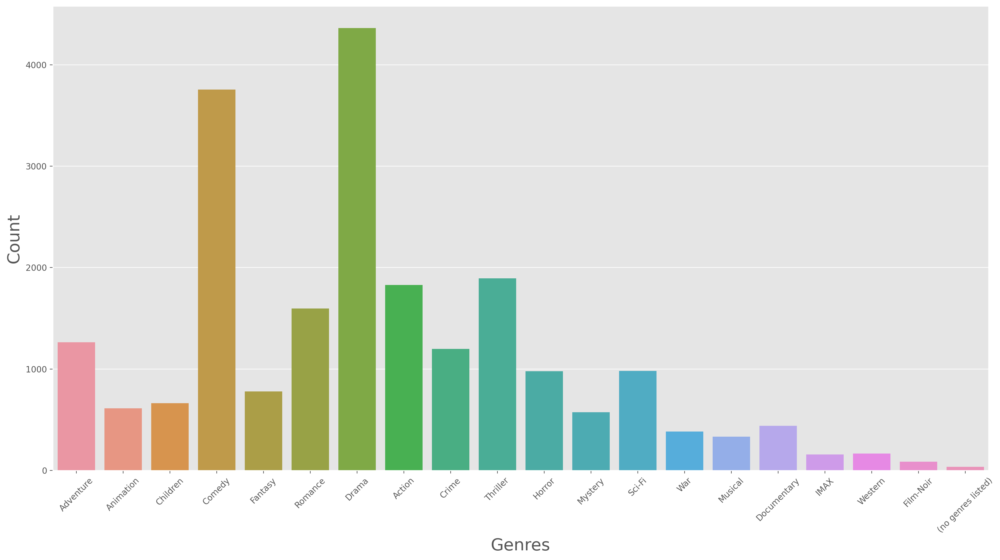

In [9]:
# Reading the movies set
movies = pd.read_csv("./assets/ml-latest-small/movies.csv")

# Setting the plot parameters
movies_copy = movies.copy()

## Seperating the genres
genres = movies_copy['genres'].str.split('|').apply(pd.Series, 1).stack()
genres.index = genres.index.droplevel(-1)

# Assign name to column
genres.name = 'genres'

# Delete old genres column
del movies_copy['genres']

# Join new column with the existing dataframe
movies_copy = movies_copy.join(genres)

# Creating the counterplot
plt.figure(figsize=(20, 10))
sb.countplot(x = 'genres', data=movies_copy)
plt.xlabel('Genres', fontsize=20)
plt.ylabel('Count', fontsize=20)
plt.xticks(rotation=45)

# Deleting the created movies dataframe for memory management
del movies, movies_copy
# Using python's gc (Garbage Collection) to free space
gc.collect()

# Showing the plot
plt.show()

Next up, we'll be looking at genre percentage distribution. To achieve this, I'll create a [pie chart using matplotlib](https://matplotlib.org/stable/gallery/pie_and_polar_charts/pie_features.html). Before the plotting process happens, there is some small dataframe processing that needs to be done. We'll first start by creating a function that extracts the year from the titles that have it and remove it using [pandas' str.extract()](https://pandas.pydata.org/docs/reference/api/pandas.Series.str.extract.html), and then create columns for each genre using [pandas' str.get_dummies()](https://pandas.pydata.org/docs/reference/api/pandas.Series.str.get_dummies.html) function. Furthermore, we'll need to rename some of the newly made columns in order to avoid errors. This is done using [pandas' rename()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.rename.html) function. Aftwerwards, we'll be getting a list of unique genres, and then calculate the number of movies for each genre. Finally, the pie chart is created and displayed.

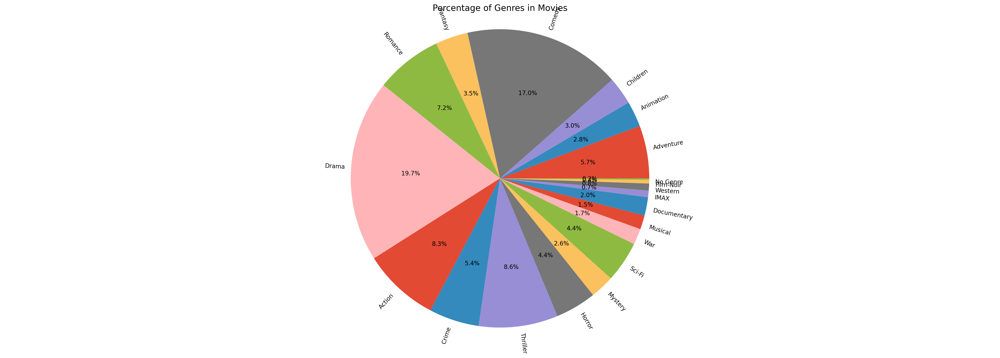

11223

In [10]:
# Reading the movies and genres set
movies = pd.read_csv("./assets/ml-latest-small/movies.csv")

# Defining a function to preprocess the movies dataframe
def preprocess_movie_csv(movies):
  
  # Copying the dataframe to avoid modifying the original
  df = movies.copy()

  # Extracting the release year from the title and removing it from the title
  df['release_year'] = df.title.str.extract("(\d4)", expand=True).astype(str)
  df['title'] = df.title.str[:-7]

  # Creating a binary column for each genre
  df = df.join(df['genres'].str.get_dummies().astype(bool))
  df.drop('genres', inplace=True, axis=1)

  # Returning the processed dataframe
  return df

processed_movie_df = preprocess_movie_csv(movies)

# Renaming columns to avoid errors
processed_movie_df.rename(columns={"(no genres listed)": "No Genre"}, inplace=True)

# Getting a list of unique genres
genres_unique = pd.DataFrame(pd.DataFrame(movies.genres.str.split('|').tolist()).stack().unique(), columns=['genre'])
genres_unique[-1:]= "No Genre"
genres_unique

# Calculate the number of movies for each genre
df_genres = processed_movie_df[genres_unique.genre].sum().reset_index()
df_genres.columns = ['genre', 'num_movies']

# Plot a pie chart of the genres and their percentages
plt.figure(figsize=(30, 10)) 
plt.pie(df_genres['num_movies'], labels=df_genres['genre'], autopct='%.1f%%', labeldistance=1.04, rotatelabels=True)
plt.title("Percentage of Genres in Movies")
plt.axis('equal')
plt.show()

# Deleting the created movies dataframe for memory management
del movies, genres_unique, processed_movie_df
# Using python's gc (Garbage Collection) to free space
gc.collect()

Wordcloud plots help us give a visual representation of the most popular words contained in a set. This visualization helps us see the distribution and frequency of words in movie titles. The wordcloud is an appropriate choice for this visualization because it visually represents the importance and prominence of each word based on its size and placement. By generating a wordcloud from the movie titles, we can quickly identify the most common words and gain insights into popular themes or genres. Additionally, using a wordcloud allows us to remove common stopwords, which are words that do not carry significant meaning and would otherwise dominate the visualization. Overall, the wordcloud effectively presents the textual data in an engaging and intuitive manner.

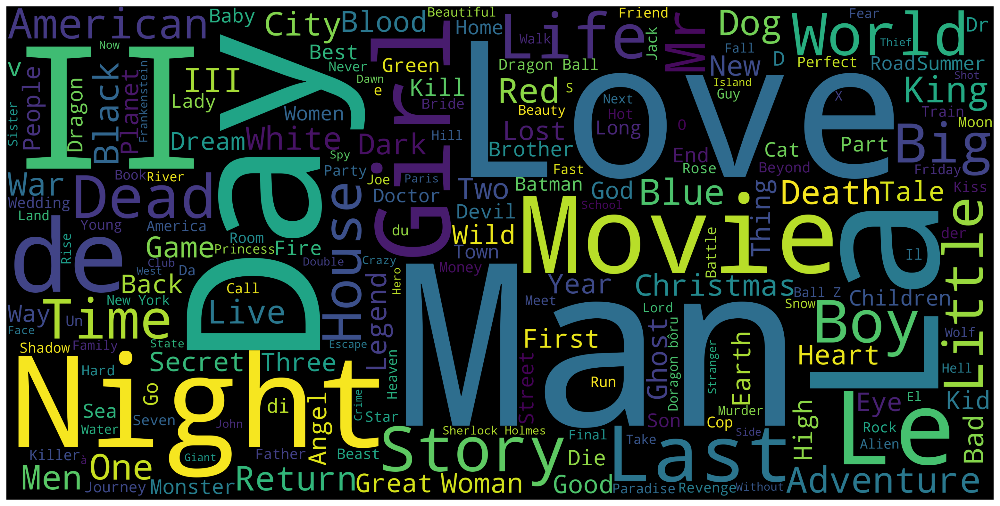

In [11]:
# Reading the movies set
movies = pd.read_csv("./assets/ml-latest-small/movies.csv")

# Create a wordcloud of the movie titles
movies['title'] = movies['title'].fillna("").astype('str')
title_corpus = ' '.join(movies['title'])
title_wc = WordCloud(stopwords=STOPWORDS, background_color='black', height=2000, width=4000).generate(title_corpus)

# Ploting the wordcloud
plt.figure(figsize=(20,10))
plt.imshow(title_wc)
plt.axis('off')
plt.show()

# Deleting the created movies dataframe for memory management
del movies
# Using python's gc (Garbage Collection) to free space
gc.collect()

# Showing the plot
plt.show()

As shown above, words like `Love`, `Man`, `Day`, `Night` and `II`, alongside others, are the ones with the most occurences in our set.

Something similar can be achieved for the `tags` set.


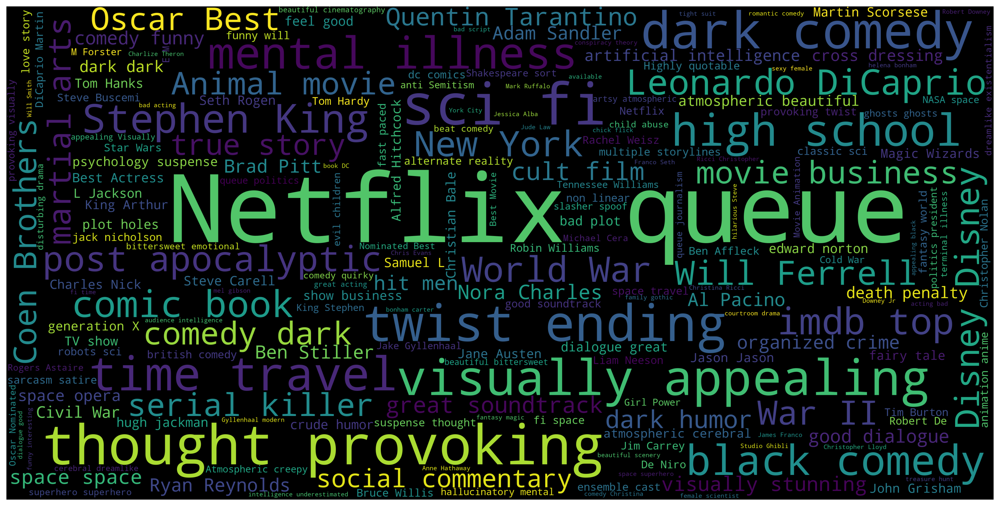

In [12]:
# Reading the tags set
tags = pd.read_csv("./assets/ml-latest-small/tags.csv")

# Create a wordcloud of the movie titles
tags['tag'] = tags['tag'].to_string()
tags_corpus = ' '.join(tags['tag'])
tags_wc = WordCloud(stopwords=STOPWORDS, background_color='black', height=2000, width=4000).generate(tags_corpus)

# Ploting the wordcloud
plt.figure(figsize=(20,10))
plt.imshow(tags_wc)
plt.axis('off')
plt.show()

# Deleting the created movies dataframe for memory management
del tags
# Using python's gc (Garbage Collection) to free space
gc.collect()

# Showing the plot
plt.show()

This initially gives us a really good look at the values contained within the set, but it's immediately apparent that `(In) Netflix Queue` takes up most of the forefront, and all things considered, I don't think it's a very accurate tag to have. In the Wordcloud below, I'll create an identical plot, but with the `Netflix` tags removed.

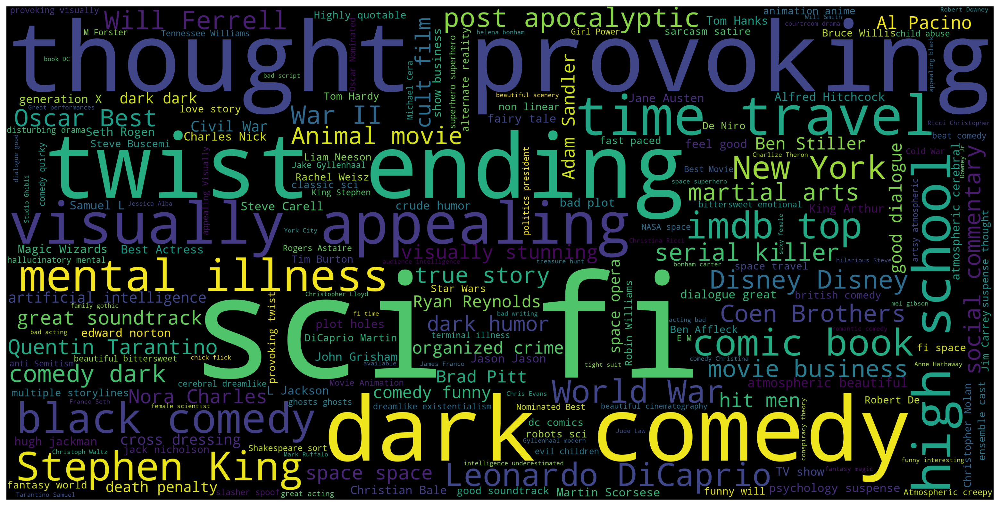

In [13]:
# Reading the tags set
tags = pd.read_csv("./assets/ml-latest-small/tags.csv")

# Removing the tags that are not relevant
tags = tags[tags.tag.isin(['In Netflix queue'])== False]

# Create a wordcloud of the movie titles
tags['tag'] = tags['tag'].to_string()
tags_corpus = ' '.join(tags['tag'])
tags_wc = WordCloud(stopwords=STOPWORDS, background_color='black', height=2000, width=4000).generate(tags_corpus)

# Ploting the wordcloud
plt.figure(figsize=(20,10))
plt.imshow(tags_wc)
plt.axis('off')
plt.show()

# Deleting the created movies dataframe for memory management
del tags
# Using python's gc (Garbage Collection) to free space
gc.collect()

# Showing the plot
plt.show()

I believe this is a better representation of the set itself, since we can now see tags like `sci fi`, `dark comedy`, `thought provoking`, which I believe is a more accurate overview for the movies that people actually watch.

Finally, let's take a look at the distribution of `ratings`. For this I will use `pandas'` [describe()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html) function and the `seaborn` [whitegrid](https://seaborn.pydata.org/tutorial/aesthetics.html) style, in order to properly show this distribution.

<Axes: xlabel='rating', ylabel='Density'>

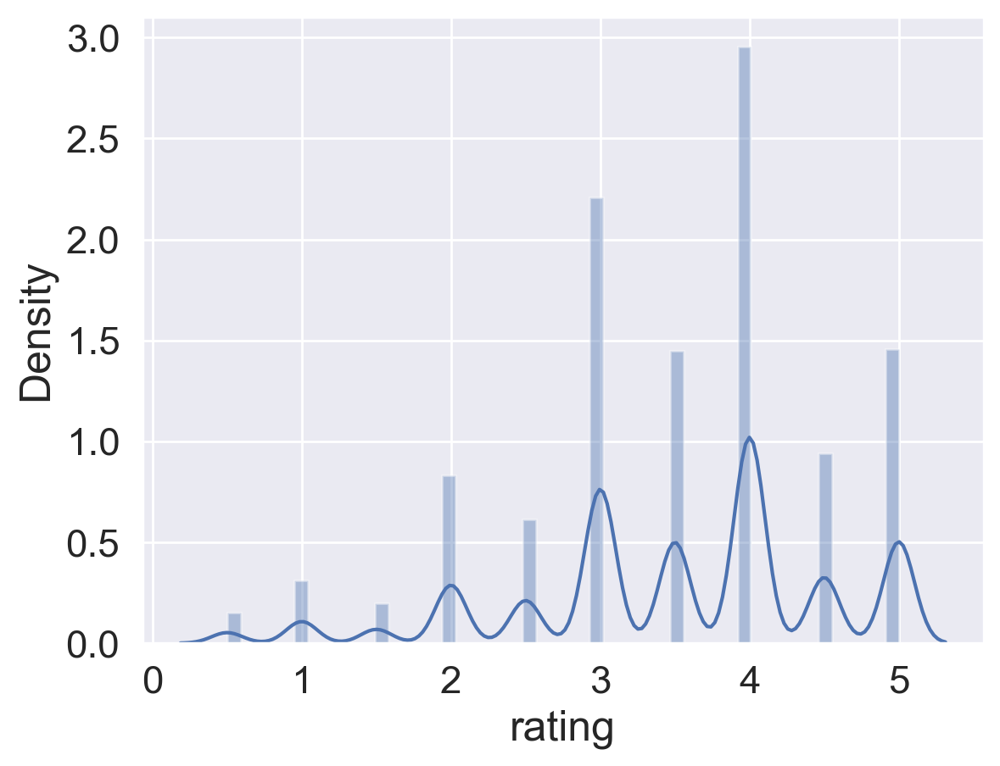

In [14]:
# Reading the tags set
ratings = pd.read_csv("./assets/ml-latest-small/ratings.csv")


ratings['rating'].describe()

# Setting up plot parameters
sb.set_style('whitegrid')
sb.set(font_scale=1.5)

# Display distribution of rating
sb.distplot(ratings['rating'].fillna(ratings['rating'].median()))

From this visualization we can conclude that users tend to rate the movies between 3 and 5 stars the most.

# Data Preparation

Since this project will be focused on showing multiple approaches to movie filtering, data preparation steps will be different. Therefore, I will do the data preparation steps during [Phase 3's](#phase-3) explanations.

<hr></hr>

# Phase 3

# Collaborative Filtering

Collaborative Filtering is a recommendation system that overcomes the drawbacks of Content-Based Filtering. It achieves this by considering similarities between users and items together to generate recommendations. This method allows for unexpected suggestions, meaning that the model can suggest an item to user A based on the interests of another user, B, who has similar preferences. Additionally, the model can automatically learn `embeddings` without the need for `manual feature engineering`. With this in mind, the input for a collaborative filtering system is made up of past data of user interactions with the movies they watch.

Advantages: 
 -  `Serendipity`: Helps the user discover new movies and interests. The machine learning system may not know the user is interested in a given item, but the model might still recommend it because similar users are interested in said item.
 -  `Great Starting Point`: All the model needs is a data matrix (explained in more detail below) in order to start recommending items. 


Disadvantages: 
 -  `Performance`: Considering the nature of [KNN (K-Nearest-Neighbors)](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html), it performs badly with large quantities of data.
 -  `The Cold Start Problem`: The inability to deal with `new` or otherwise called `fresh data`. The system can't accurately create embeddings and query the model with these items.
 -  `Difficulty Of Including Side Features`: Features like `country`, `age`, `producer` and the like can't be included. This makes the overall result a little less accurate.

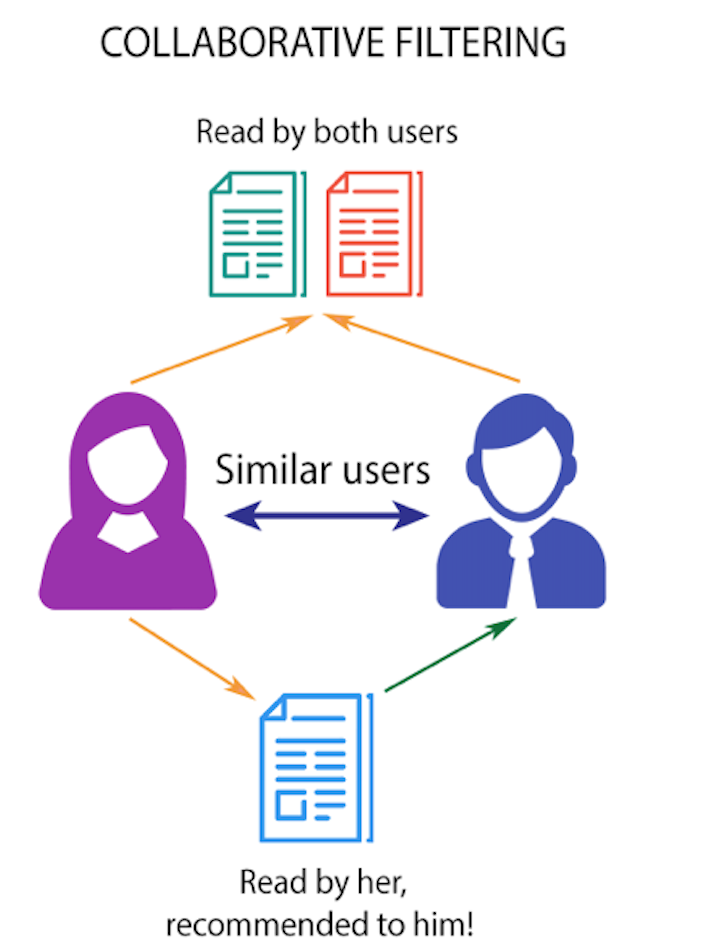

*`Sources used:`*

*https://developers.google.com/machine-learning/recommendation/collaborative/basics*

*https://developers.google.com/machine-learning/crash-course/embeddings/video-lecture*

*https://developers.google.com/machine-learning/recommendation/collaborative/summary*

*Rocca, B. (2019, June 12). Introduction to recommender systems. Medium.* 

*Retrieved April 17, 2023, from https://towardsdatascience.com/introduction-to-recommender-systems-6c66cf15ada* 

*Patel, H. (2021, September 2). What is feature engineering - importance, tools and techniques for machine learning. Medium.*

*Retrieved April 27, 2023, from https://towardsdatascience.com/what-is-feature-engineering-importance-tools-and-techniques-for-machine-learning-2080b0269f10*

*`Glossary`*

* [Embedding](https://developers.google.com/machine-learning/crash-course/embeddings/video-lecture) - *Embeddings are low-dimensional spaces into which you can translate high-dimensional vectors. These make it easier to do machine learning on larger inputs.*
* [Manual Feature Engineering](https://towardsdatascience.com/what-is-feature-engineering-importance-tools-and-techniques-for-machine-learning-2080b0269f10#:~:text=Feature%20engineering%20is%20a%20machine,while%20also%20enhancing%20model%20accuracy.) - *Feature engineering is a machine learning technique that leverages data to create new variables that aren’t in the training set.*
* [Cold-start](https://www.expressanalytics.com/blog/cold-start-problem/) - *Relates to a lack of data when a product is new to the market. A lack of data makes it difficult to have the necessary prerequisites in place in order to make accurate predictions.*


<hr></hr>

## Preprocessing

We'll start off by loading all of the sets back into memory, for usage in the Preprocessing step.

In [15]:
# Importing Data

ratings = pd.read_csv("./assets/ml-latest-small/ratings.csv")
movies = pd.read_csv("./assets/ml-latest-small/movies.csv")
tags = pd.read_csv("./assets/ml-latest-small/tags.csv")

Next, we'll use Python's [display](https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html) module to get a quick look at the data we're going to be working with in this step.

In [16]:
mdStyler = movies.head(5).style.set_table_attributes("style='display:inline'")
raStyler = ratings.head(5).style.set_table_attributes("style='display:inline'")
taStyler = tags.head(5).style.set_table_attributes("style='display:inline'")
display_html(mdStyler._repr_html_()+raStyler._repr_html_()+taStyler._repr_html_(), raw=True)

movieId 
 title 
 genres 
 
 
 
 
 0 
 1 
 Toy Story (1995) 
 Adventure|Animation|Children|Comedy|Fantasy 
 
 
 1 
 2 
 Jumanji (1995) 
 Adventure|Children|Fantasy 
 
 
 2 
 3 
 Grumpier Old Men (1995) 
 Comedy|Romance 
 
 
 3 
 4 
 Waiting to Exhale (1995) 
 Comedy|Drama|Romance 
 
 
 4 
 5 
 Father of the Bride Part II (1995) 
 Comedy 
 
 
 

 
 
 
   
 userId 
 movieId 
 rating 
 timestamp 
 
 
 
 
 0 
 1 
 1 
 4.000000 
 964982703 
 
 
 1 
 1 
 3 
 4.000000 
 964981247 
 
 
 2 
 1 
 6 
 4.000000 
 964982224 
 
 
 3 
 1 
 47 
 5.000000 
 964983815 
 
 
 4 
 1 
 50 
 5.000000 
 964982931 
 
 
 

 
 
 
   
 userId 
 movieId 
 tag 
 timestamp 
 
 
 
 
 0 
 2 
 60756 
 funny 
 1445714994 
 
 
 1 
 2 
 60756 
 Highly quotable 
 1445714996 
 
 
 2 
 2 
 60756 
 will ferrell 
 1445714992 
 
 
 3 
 2 
 89774 
 Boxing story 
 1445715207 
 
 
 4 
 2 
 89774 
 MMA 
 1445715200

Next, for the `Nearest Neighbors` algorithm to work it requires numeric values. To solve this, we'll make a Pivot table where each column will represent each `userId` and each row represents each `movieId`.

In [17]:
# rm stands for Rating Matrix
rm = ratings.pivot(index='movieId',columns='userId',values='rating')
rm.head()

userId,1,2,3,4,5,6,7,8,9,10,...,601,602,603,604,605,606,607,608,609,610
movieId,,,,,,,,,,,,,,,,,,,,,
1,4.0,NaN,NaN,NaN,4.0,NaN,4.5,NaN,NaN,NaN,...,4.0,NaN,4.0,3.0,4.0,2.5,4.0,2.5,3.0,5.0
2,NaN,NaN,NaN,NaN,NaN,4.0,NaN,4.0,NaN,NaN,...,NaN,4.0,NaN,5.0,3.5,NaN,NaN,2.0,NaN,NaN
3,4.0,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN


Looking at the matrix above, we can see that most of the values are marked as `NaN`, or `null`. To fix this, we'll be using pandas' [fillna](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.fillna.html) to replace the `null` values with zeroes instead. This in turn, will allow the `Nearest Neighbors` algorithm to calculate movie similarity.

In [18]:
rm.fillna(0, inplace=True)
rm

userId,1,2,3,4,5,6,7,8,9,10,...,601,602,603,604,605,606,607,608,609,610
movieId,,,,,,,,,,,,,,,,,,,,,
1,4.0,0.0,0.0,0.0,4.0,0.0,4.5,0.0,0.0,0.0,...,4.0,0.0,4.0,3.0,4.0,2.5,4.0,2.5,3.0,5.0
2,0.0,0.0,0.0,0.0,0.0,4.0,0.0,4.0,0.0,0.0,...,0.0,4.0,0.0,5.0,3.5,0.0,0.0,2.0,0.0,0.0
3,4.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193581,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
193583,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
193585,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Feeding mostly zeroes to the algorithm wouldn't be very practical, so, for performance reasons, we'll strip and compress the data with [scipy's csr_matrix](https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.csr_matrix.html) approach. One advantage would be memory compression, due to the sparsity of the created data. The other advantage would be saves at calculation time, both of those factors improving notebook performance. 

*Glossary*

`csr_matrix` - Compressed Space Row Matrix

*For Further Reference*:

*https://www.educba.com/sparse-matrix-in-python/*

In [19]:
# cm stands for Compressed Matrix
cm = csr_matrix(rm.values)
rm.reset_index(inplace=True)
cm

<9724x610 sparse matrix of type '<class 'numpy.float64'>'
	with 100836 stored elements in Compressed Sparse Row format>

<hr></hr>

## Modelling

Now that the [Preprocessing](#preprocessing) step is done, we can move on to the model training step. First I'll run a [grid search](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) in order to optimize algorithm performance.

In [20]:
# Define the parameter grid for Grid Search
param_grid = {
    'n_neighbors': [10, 20, 30],
    'algorithm': ['ball_tree', 'kd_tree', 'brute'],
    'n_jobs': [-1, 1, None]
}

# Create a NearestNeighbors instance
knn = NearestNeighbors()

# Create a GridSearchCV object + addidng scoring, to combat the lack of such system in NearestNeighbors
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the GridSearchCV object to the data
grid_search.fit(cm)

# Print the best parameters from the Grid Search
print("Best parameters:", grid_search.best_params_)

Best parameters: {'algorithm': 'ball_tree', 'n_jobs': -1, 'n_neighbors': 10}


From the outputs above, we can see that the grid search suggests we use the following:
- `ball tree` algorithm: BallTree is easily explained as a [Metric Tree](http://mlwiki.org/index.php/Metric_Trees). These organize and structure data points considering the metric space in which the points are located.
- `n_jobs=-1`: This ensures that the training process will be done using all the available processing cores.
- `n_neighbors=10`: Number of neighbors that the algorithm uses by default.

In [21]:
knn_bt = NearestNeighbors(algorithm='ball_tree',  n_jobs=-1, n_neighbors=10)
knn_bt.fit(cm)

NearestNeighbors(algorithm='ball_tree', n_jobs=-1, n_neighbors=10)

<hr></hr>

The last step is to display the recommendations made by the algorithm. For this, I have built a function that returns the top 10 movies that are most similar to the input movie based on KNN scores. This function works by:
- First taking the `movieName` parameter
- Checks if the input movie is in the dataset.
- If the check passes, it converts the input movie name to a string and uses it to filter the movies DataFrame to find movies that contain the input movie name.
- If any movies match the input name, it proceeds to find the movieId of the first matching movie in the dataframe, then finds the index of that movieId in a ratings matrix called `rm`.
- Use the KNN algorithm we configured to find the 5 closest movies to the input movie in the `rm` matrix, based on a distance metric.
- Sorts the movies by their distance to the input movie and stores them in a list along with their similarity scores. 
- Creates a new DataFrame from this list and returns it.
- Function is then run separately in order to display the results.

In [22]:
def ball_tree_movie_recommendations(movieName):
    recommendations = 11
    
    # Check if movie matches exist within the dataset
    movieList = movies[movies['title'].str.contains(movieName, case=False)]

    # Check if we found any movies that match the input parameter
    count = len(movieList)
    if count > 0:
        # Get movieId from movieList
        movieIdx = movieList.iloc[0]['movieId']

        # Get movieId from the ratings matrix
        movieIdx = rm[rm['movieId']== movieIdx].index[0]

        # Get indices and similarity for the 5 closest moviesId's
        distances, indices = knn_bt.kneighbors(cm[movieIdx], n_neighbors=recommendations)

        # Sorting the two arrays and merge them into a series of tuples
        recommenedMovieIndices = sorted(list(zip(indices.squeeze().tolist(), distances.squeeze().tolist())), key=lambda x: x[1])[:0:-1]
        recommenedMovies = []
        for val in recommenedMovieIndices:
            # Find movieID inside of the ratings matrix
            movieIdx = rm.iloc[val[0]]['movieId']

            # Find the index of the movie row in the movies dataset
            idx = movies[movies['movieId'] == movieIdx].index
            
            # Add title and distance of each movie compared to the input parameter
            recommenedMovies.append({'Title': movies.iloc[idx]['title'].values[0], 'Similarity': val[1]})

        # Adding the found values to a new DataFrame that the function will return
        df = pd.DataFrame(recommenedMovies, index=range(1, recommendations))
        return df
    else:
        return "Couldn't generate recommendations for " + movieName

In [23]:
ball_tree_movie_recommendations('Iron Man')

,Title,Similarity
1,Guardians of the Galaxy (2014),32.081926
2,Pirates of the Caribbean: At World's End (2007),32.015621
3,Star Trek (2009),31.925695
4,Kung Fu Panda (2008),31.697792
5,X-Men: First Class (2011),31.610916
6,Watchmen (2009),31.527766
7,Iron Man 3 (2013),31.300958
8,Thor (2011),30.683872
9,"Avengers, The (2012)",29.702693
10,Iron Man 2 (2010),29.098969


By using the recommendations made by the grid search, we get some pretty wild results. That shouldn't really be possible, therefore I'll use the `brute` algorithm instead, and `cosine` metrics to achieve a good result.

In [24]:
# croissant metrics🥐 fr
knn = NearestNeighbors(metric='cosine', algorithm='brute', n_neighbors=30, n_jobs=-1)
knn.fit(cm)

NearestNeighbors(algorithm='brute', metric='cosine', n_jobs=-1, n_neighbors=30)

In [25]:
def movie_recommendations(movieName):
    recommendations = 11
    
    # Check if movie matches exist within the dataset
    movieList = movies[movies['title'].str.contains(movieName, case=False)]
    # Check if we found any movies that match the input parameter
    count = len(movieList)
    if count > 0:
        # Get movieId from movieList
        movieIdx = movieList.iloc[0]['movieId']

        # Get movieId from the ratings matrix
        movieIdx = rm[rm['movieId']== movieIdx].index[0]

        # Get indices and distance for the 5 closest moviesId's
        distances, indices = knn.kneighbors(cm[movieIdx], n_neighbors=recommendations)
        # Sorting the two arrays and merge them into a series of tuples
        recommenedMovieIndices = sorted(list(zip(indices.squeeze().tolist(), distances.squeeze().tolist())),key=lambda x: x[1])[:0:-1]

        recommenedMovies = []
        for val in recommenedMovieIndices:
            # Find movieID inside of the ratings matrix
            movieIdx = rm.iloc[val[0]]['movieId']

            # Find the index of the movie row in the movies dataset
            idx = movies[movies['movieId'] == movieIdx].index

            # Add title and distance of each movie compared to the input parameter
            recommenedMovies.append({'Title': movies.iloc[idx]['title'].values[0], 'Similarity': val[1]})

        # Adding the found values to a new DataFrame that the function will return
        df = pd.DataFrame(recommenedMovies, index=range(1, recommendations))
        return df
    else:
        return "Couldn't generate recommendations for " + movieName


<hr></hr>

## Results


In [26]:
movie_recommendations('Iron Man')

,Title,Similarity
1,Star Trek (2009),0.417513
2,Guardians of the Galaxy (2014),0.411029
3,Thor (2011),0.410508
4,Up (2009),0.403264
5,Batman Begins (2005),0.402929
6,Avatar (2009),0.375732
7,Iron Man 2 (2010),0.358014
8,"Avengers, The (2012)",0.341324
9,WALL·E (2008),0.332225
10,"Dark Knight, The (2008)",0.329462


In [27]:
movie_recommendations('Toy Story')

,Title,Similarity
1,Back to the Future (1985),0.469619
2,Groundhog Day (1993),0.465831
3,Mission: Impossible (1996),0.461087
4,Star Wars: Episode VI - Return of the Jedi (1983),0.458911
5,"Lion King, The (1994)",0.458855
6,Forrest Gump (1994),0.452904
7,Star Wars: Episode IV - A New Hope (1977),0.442612
8,Independence Day (a.k.a. ID4) (1996),0.435738
9,Jurassic Park (1993),0.434363
10,Toy Story 2 (1999),0.427399


In [28]:
movie_recommendations('Lion King, The')

,Title,Similarity
1,Snow White and the Seven Dwarfs (1937),0.445873
2,Home Alone (1990),0.441470
3,Babe (1995),0.423786
4,Forrest Gump (1994),0.413554
5,Jumanji (1995),0.411562
6,Jurassic Park (1993),0.385153
7,"Mask, The (1994)",0.361085
8,Mrs. Doubtfire (1993),0.349910
9,Beauty and the Beast (1991),0.291639
10,Aladdin (1992),0.282091


<hr></hr>

## Summary

While the results aren't the best, we can see what other users that have watched these movies also enjoyed. The results are pretty much in tune with what I expected. It doesn't always recommend movies from the same genre for example, but rather recommends movies from a wider amounts of genres that the user can enjoy.

I'll finish off Collaborative Filtering by deleting the dataframes used in preparation for the [Content Based Filtering](#content-based-filtering) approach.

In [29]:
# Deleting the created dataframes for memory management
del ratings, movies, tags

# Using python's gc (Garbage Collection) to free space
gc.collect()

231

<hr></hr>

# Content Based Filtering

Content-based recommender systems rely on the comparison of different features or attributes of movies. By utilizing this type of system, if a user views a particular movie, other movies that share similar characteristics are suggested. For instance, if a user watches a comedy film featuring Adam Sandler, the recommender system will propose other movies in the same genre or with the same actor, or both. Therefore, when creating a content-based recommender system, the movie attributes serve as the input.

Advantages: 
 -  `No other data needs to be collected from users`: Once a user starts making a few searches in a system, this algorithm can already make accurate predictions.
 -  `Transparency and Relevancy`: Given recommendations are usually relevant to the users.
 -  `Mitigates the cold-start problem.`

Disadvantages: 
 -  `High level of entry`: Requires a lot of [domain understanding](#domain-understanding).
 -  `Suffers from a lack of further expansion or scalability`: Upon adding new content to the set, all of its attributes must be defined and tagged, thus making it very tedious and time-consuming in the long run. 

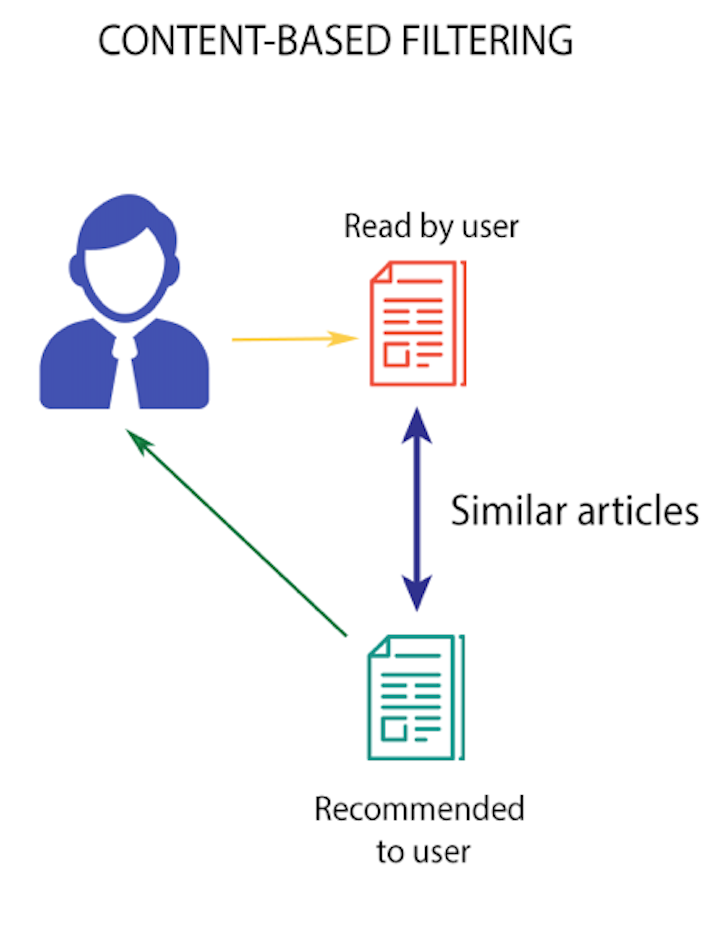 

*`Sources used:`* 

*Vidiyala, R. (2020, October 21).* 

*How to build a movie recommendation system? Medium.* 

*Retrieved April 17, 2023, from https://towardsdatascience.com/how-to-build-a-movie-recommendation-system-67e321339109*

*What content-based filtering is &amp; why you should use it - upwork. (n.d.).* 

*Retrieved April 17, 2023, from https://www.upwork.com/resources/what-is-content-based-filtering*

*`Glossary`*

* [Cold-start](https://www.expressanalytics.com/blog/cold-start-problem/) - Relates to a lack of data when a product is new to the market. A lack of data makes it difficult to have the necessary prerequisites in place in order to make accurate predictions.

<hr></hr>

# Preprocessing

I'll start off by re-importing the needed dataframes for this step.

In [3]:
# Re-importing the dataframes
movies = pd.read_csv("./assets/ml-latest-small/movies.csv")
tags = pd.read_csv("./assets/ml-latest-small/tags.csv")

Just like before, I'll use Python's [display](https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html) module to take a look at the data we're going to be working with in this step.

The features that I'll be using from the datasets are as follows: 
- `tag` from the `Tags` set
- `genres`, `title` and from `Movies` set

In [4]:
mdStyler = movies.head(5).style.set_table_attributes("style='display:inline'")
taStyler = tags.head(5).style.set_table_attributes("style='display:inline'")
display_html(mdStyler._repr_html_()+taStyler._repr_html_(), raw=True)

movieId 
 title 
 genres 
 
 
 
 
 0 
 1 
 Toy Story (1995) 
 Adventure|Animation|Children|Comedy|Fantasy 
 
 
 1 
 2 
 Jumanji (1995) 
 Adventure|Children|Fantasy 
 
 
 2 
 3 
 Grumpier Old Men (1995) 
 Comedy|Romance 
 
 
 3 
 4 
 Waiting to Exhale (1995) 
 Comedy|Drama|Romance 
 
 
 4 
 5 
 Father of the Bride Part II (1995) 
 Comedy 
 
 
 

 
 
 
   
 userId 
 movieId 
 tag 
 timestamp 
 
 
 
 
 0 
 2 
 60756 
 funny 
 1445714994 
 
 
 1 
 2 
 60756 
 Highly quotable 
 1445714996 
 
 
 2 
 2 
 60756 
 will ferrell 
 1445714992 
 
 
 3 
 2 
 89774 
 Boxing story 
 1445715207 
 
 
 4 
 2 
 89774 
 MMA 
 1445715200

From that visualization, we can see that the data in `tag` and `genres` is a bit messy, in the form of the `|` separators in `genres` and some capitalized `tags` at a first glance. 

In the code sections below, I will rectify these problems and clean up the sets.  

I'll start off the cleaning steps by filling the null values in the set with quotes using [pandas' fillna() function](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.fillna.html). Afterwards, I will use the [drop()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html) function to remove the unnecessary `timestamp` and `userId` columns. I opted to remove the user information, because it's irrelevant for this filtering approach. 

In [5]:
# Dropping uneeded tags + userId and timestamp columns
tags = tags.fillna("")
tags = tags.drop(columns={"timestamp", "userId"})
print(tags)

      movieId               tag
0       60756             funny
1       60756   Highly quotable
2       60756      will ferrell
3       89774      Boxing story
4       89774               MMA
...       ...               ...
3678     7382         for katie
3679     7936           austere
3680     3265            gun fu
3681     3265  heroic bloodshed
3682   168248  Heroic Bloodshed

[3683 rows x 2 columns]


The next step is to fix the capitalization of some of the tags. For this, I opted to first use the [string strip()](https://www.w3schools.com/python/ref_string_strip.asp) method, to first get rid of any potential `leading` or `trailing` spaces. Afterwards, I'll use the [string lower()](https://www.w3schools.com/python/ref_string_lower.asp) function to make all of the tags lowercase.

*`Glossary`*:
- `Leading (space)`: Spaces at the beginning.
- `Trailing (space)`: Spaces at the end.

In [6]:
# Removing empty spaces in the tags dataframe and making all tags lowercase
tags["tag"] = tags["tag"].str.strip()
tags["tag"] = tags["tag"].str.lower()

# Removing special characters from the tags dataframe
tags["tag"] = tags["tag"].str.replace(',','')
tags["tag"] = tags["tag"].str.replace('.','')
tags["tag"] = tags["tag"].str.replace('(','')
tags["tag"] = tags["tag"].str.replace(')','')

print(tags)

      movieId               tag
0       60756             funny
1       60756   highly quotable
2       60756      will ferrell
3       89774      boxing story
4       89774               mma
...       ...               ...
3678     7382         for katie
3679     7936           austere
3680     3265            gun fu
3681     3265  heroic bloodshed
3682   168248  heroic bloodshed

[3683 rows x 2 columns]


Next up, I'll strip the tags again, more for redundancy, in case the string replacements made in the previous code block introduced accidental leading or trailing spaces. I'll finish this step off by grouping all of tags by the `movieId` attribute.

In [7]:
# Row SR
tags["tag"] = tags["tag"].str.strip()

# Group all rows by movieId
tags['tag'] = tags.groupby(['movieId'])['tag'].transform(lambda x: ' '.join(x))
tags.head(5)

,movieId,tag
0,60756,funny highly quotable will ferrell comedy funn...
1,60756,funny highly quotable will ferrell comedy funn...
2,60756,funny highly quotable will ferrell comedy funn...
3,89774,boxing story mma tom hardy
4,89774,boxing story mma tom hardy


The previous print of the tags dataframe suggests that we have some duplicates to still take care of. This will be solved by using [pandas' drop_duplicates()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop_duplicates.html) function.

In [8]:
# Remove all duplicates
tags = tags.drop_duplicates()
tags.head(5)

,movieId,tag
0,60756,funny highly quotable will ferrell comedy funn...
3,89774,boxing story mma tom hardy
6,106782,drugs leonardo dicaprio martin scorsese stock ...
9,48516,way too long leonardo dicaprio suspense twist ...
10,431,al pacino gangster mafia


With the `tags` dataframe being cleaned up, we can move on to cleaning up the `movies` dataframe.

I'll start off cleaning this dataframe by first using the [str.replace()](https://www.w3schools.com/python/ref_string_replace.asp) function to replace the `|` character with a space, and then using a similar approach towards replacing the `no genres listed` attribute with an easier to read `NoGenre` attribute.

Futhermore, I created a small function `findGenre` to find all non-empty `substrings` separated by spaces or at the end of the string and used [pandas' apply()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html) function to apply `findGenre` to each row.

How `findGenre` works:
- It uses python's [re](https://docs.python.org/3/library/re.html) library. `re` stands for `Regular Expression`, or `regex`, and it's a very powerful tool for describing search patterns. There are a lot of `metacharacters` that can be used while building `re` functions. These are the ones I opted to use:
  - `()` ->  Enclose a group of REs.
  - `.` ->  Matches any character except newline.
  - `+` ->  One or more occurrences.
  - `?` ->  Matches zero or one occurrence.
  - `\` ->  Used to drop the special meaning of character.
  - `|` ->  Means "or" (Matches with any of the characters separated by it).
  - `$` ->  Matches pattern at the end of the string.
- The resulting list of genres is returned.

*`Glossary:`*
- Substrings: Sequence of characters within another string.

*`For further reference:`*
- *https://www.edureka.co/blog/substring-in-python/#what*
- *https://www.geeksforgeeks.org/python-regex-re-search-vs-re-findall/*
- *https://pynative.com/python-regex-metacharacters/*

In [9]:
# Replace characters
movies["genres"]= movies["genres"].str.replace("|"," ",regex=False) 
movies["genres"]= movies["genres"].str.replace("(no genres listed)","NoGenre",regex=False) 

def findGenre(genre):
    return re.findall("(.+?)(?:\s|$)", genre)

# Apply the findGenre function to the genres column
movies["genres"] = movies["genres"].apply(findGenre)
movies.head(5)

,movieId,title,genres
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]"
1,2,Jumanji (1995),"[Adventure, Children, Fantasy]"
2,3,Grumpier Old Men (1995),"[Comedy, Romance]"
3,4,Waiting to Exhale (1995),"[Comedy, Drama, Romance]"
4,5,Father of the Bride Part II (1995),[Comedy]


Now that the `movie` set is cleaned, we can move on to merging the cleaned `tags` and `movies` sets. 

In [10]:
# Combining all the processed data into one dataframe
df = pd.merge(movies, tags, on="movieId", how="left")
df

,movieId,title,genres,tag
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",pixar pixar fun
1,2,Jumanji (1995),"[Adventure, Children, Fantasy]",fantasy magic board game robin williams game
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",moldy old
3,4,Waiting to Exhale (1995),"[Comedy, Drama, Romance]",NaN
4,5,Father of the Bride Part II (1995),[Comedy],pregnancy remake
...,...,...,...,...
9737,193581,Black Butler: Book of the Atlantic (2017),"[Action, Animation, Comedy, Fantasy]",NaN
9738,193583,No Game No Life: Zero (2017),"[Animation, Comedy, Fantasy]",NaN
9739,193585,Flint (2017),[Drama],NaN
9740,193587,Bungo Stray Dogs: Dead Apple (2018),"[Action, Animation]",NaN


After the merge, `NaN` values are still present in the `tag` column, but this is easily fixed by replacing said values with empty strings. For this purpose, I'll be using the [fillna()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.fillna.html) function once more.

In [11]:
df["tag"]= df["tag"].fillna("")
df

,movieId,title,genres,tag
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",pixar pixar fun
1,2,Jumanji (1995),"[Adventure, Children, Fantasy]",fantasy magic board game robin williams game
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",moldy old
3,4,Waiting to Exhale (1995),"[Comedy, Drama, Romance]",
4,5,Father of the Bride Part II (1995),[Comedy],pregnancy remake
...,...,...,...,...
9737,193581,Black Butler: Book of the Atlantic (2017),"[Action, Animation, Comedy, Fantasy]",
9738,193583,No Game No Life: Zero (2017),"[Animation, Comedy, Fantasy]",
9739,193585,Flint (2017),[Drama],
9740,193587,Bungo Stray Dogs: Dead Apple (2018),"[Action, Animation]",


The next step is to create a new column that contains all the processed information thus far. This will be useful for the [Modeling](#modeling) section. The way I'll aim to achieve this is by using [pandas' astype()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.astype.html) function. It's main use is to convert the data type of an existing data column in a dataset or a data frame, thus allowing us to concatenate all our columns together.

*`For further reference:`*
- *https://www.askpython.com/python/built-in-methods/python-astype*
- *https://www.geeksforgeeks.org/python-pandas-dataframe-astype/*

In [12]:
df["fullcol"]=df.title.astype(str) + " " + df.genres.astype(str) + " " + df.tag.astype(str)
df

,movieId,title,genres,tag,fullcol
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",pixar pixar fun,"Toy Story (1995) ['Adventure', 'Animation', 'C..."
1,2,Jumanji (1995),"[Adventure, Children, Fantasy]",fantasy magic board game robin williams game,"Jumanji (1995) ['Adventure', 'Children', 'Fant..."
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",moldy old,"Grumpier Old Men (1995) ['Comedy', 'Romance'] ..."
3,4,Waiting to Exhale (1995),"[Comedy, Drama, Romance]",,"Waiting to Exhale (1995) ['Comedy', 'Drama', '..."
4,5,Father of the Bride Part II (1995),[Comedy],pregnancy remake,Father of the Bride Part II (1995) ['Comedy'] ...
...,...,...,...,...,...
9737,193581,Black Butler: Book of the Atlantic (2017),"[Action, Animation, Comedy, Fantasy]",,Black Butler: Book of the Atlantic (2017) ['Ac...
9738,193583,No Game No Life: Zero (2017),"[Animation, Comedy, Fantasy]",,"No Game No Life: Zero (2017) ['Animation', 'Co..."
9739,193585,Flint (2017),[Drama],,Flint (2017) ['Drama']
9740,193587,Bungo Stray Dogs: Dead Apple (2018),"[Action, Animation]",,"Bungo Stray Dogs: Dead Apple (2018) ['Action',..."


Since there still are some characters I wasn't able to remove in the `fullcol` column, so this needs to be done before we can move on to the modeling phase. For this, I'll once again use the [str.replace()](https://www.w3schools.com/python/ref_string_replace.asp) function.

In [13]:
# Using python's string replace to remove all the symbols from the fullcol column
df["fullcol"] = df["fullcol"].str.replace('[','')
df["fullcol"] = df["fullcol"].str.replace(']','')
df["fullcol"] = df["fullcol"].str.replace(',','')
df["fullcol"] = df["fullcol"].str.replace('(','')
df["fullcol"] = df["fullcol"].str.replace(')','')
df["fullcol"] = df["fullcol"].str.replace('','')
df["fullcol"] = df["fullcol"].replace({'["\']': ''}, regex=True)

df

,movieId,title,genres,tag,fullcol
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",pixar pixar fun,Toy Story 1995 Adventure Animation Children Co...
1,2,Jumanji (1995),"[Adventure, Children, Fantasy]",fantasy magic board game robin williams game,Jumanji 1995 Adventure Children Fantasy fantas...
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",moldy old,Grumpier Old Men 1995 Comedy Romance moldy old
3,4,Waiting to Exhale (1995),"[Comedy, Drama, Romance]",,Waiting to Exhale 1995 Comedy Drama Romance
4,5,Father of the Bride Part II (1995),[Comedy],pregnancy remake,Father of the Bride Part II 1995 Comedy pregna...
...,...,...,...,...,...
9737,193581,Black Butler: Book of the Atlantic (2017),"[Action, Animation, Comedy, Fantasy]",,Black Butler: Book of the Atlantic 2017 Action...
9738,193583,No Game No Life: Zero (2017),"[Animation, Comedy, Fantasy]",,No Game No Life: Zero 2017 Animation Comedy Fa...
9739,193585,Flint (2017),[Drama],,Flint 2017 Drama
9740,193587,Bungo Stray Dogs: Dead Apple (2018),"[Action, Animation]",,Bungo Stray Dogs: Dead Apple 2018 Action Anima...


<hr></hr>

# Modeling

For Content-Based Filtering, I opted to use the `Cosine Similarity` algorithm, but first we need to implement the `TF-IDF Vectorizer`. 

`TF-IDF` is a significant metric that algorithms such as cosine similarity and linear kernel employ. It transforms an assemblage of unprocessed documents into a `TF-IDF feature matrix`. `TfidfVectorizer` unites all of the capabilities of `CountVectorizer` and `TfidfTransformer` into a solitary model. Using a vocabulary stored in memory, `TfidfVectorizer` maps the most commonly used words to feature indices and produces a matrix of word frequency. 

The hyperparameters I chose to use are:
- `analyzer`: Whether the feature should be made of word or character n-grams. 
- `stop_words`: Removes english stop words.
- `min_df`: When building the vocabulary ignore terms that have a document frequency strictly lower than the given threshold.
- `lowecase`: Convert all characters to lowercase before tokenizing.

*`For further reference:`*
- *https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html*
- *https://medium.com/@cmukesh8688/tf-idf-vectorizer-scikit-learn-dbc0244a911a*

In [14]:
fullcol = df["fullcol"]

# Declaring the vectorizer
vectorizer = TfidfVectorizer(analyzer='word', stop_words='english', min_df=0)

# Generating the matrix
matrix = vectorizer.fit_transform(fullcol)

# Accessing the word corpus
word_corpus = vectorizer.get_feature_names_out()

matrix

<9742x10093 sparse matrix of type '<class 'numpy.float64'>'
	with 59468 stored elements in Compressed Sparse Row format>

### Model Transparency

When it comes to transparency, the `TF-IDF vectorizer` offers a `clear and interpretable` approach. It operates by `assigning weights` to individual terms based on their `frequency` in a document and their `inverse frequency` across the entire document corpus. This weighting scheme allows the vectorizer to `capture the importance of a term` in a document while considering its significance in the broader context. The transparency of the TF-IDF vectorizer lies in its `straightforward calculation process`, where the frequency and inverse frequency components are clearly defined and easily comprehensible. In our application, this transparency makes it `very easy to visualize` what the algorithm is actually doing with our dataset. The `vectorizer` features a [get_feature_names_out()](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) which can assign the words that the algorithm `captures` to a variable that we can use for further visualizations. Below, we'll create a function that displays the contents of said variable.

In [15]:
from tabulate import tabulate

# Creating a table
table = []
for word in word_corpus:
    table.append([word])

# Adding the count of words
word_count = len(word_corpus)
table.append(["Total words:", str(word_count)])  # Convert word_count to string

# Displaying the table
headers = ["Word"]
print(tabulate(table, headers, tablefmt="fancy_grid"))

╒════════════════════╕
│ Word               │
╞════════════════════╡
│ 00                 │
├────────────────────┤
│ 007                │
├────────────────────┤
│ 04                 │
├────────────────────┤
│ 06                 │
├────────────────────┤
│ 10                 │
├────────────────────┤
│ 100                │
├────────────────────┤
│ 1000               │
├────────────────────┤
│ 10000              │
├────────────────────┤
│ 101                │
├────────────────────┤
│ 102                │
├────────────────────┤
│ 10th               │
├────────────────────┤
│ 11                 │
├────────────────────┤
│ 110901             │
├────────────────────┤
│ 1138               │
├────────────────────┤
│ 11th               │
├────────────────────┤
│ 12                 │
├────────────────────┤
│ 120                │
├────────────────────┤
│ 127                │
├────────────────────┤
│ 13                 │
├────────────────────┤
│ 13th               │
├────────────────────┤
│ 14       

While not very clear from the table above, we can see that the algorithm creates quite a sizeable `weighted dictionary` of words, in our case containing `10093` words. 

In [16]:
num_words = len(word_corpus)
print("Number of words in the word corpus:", num_words)

Number of words in the word corpus: 10093


Finally, we'll be creating a [wordcloud](https://amueller.github.io/word_cloud/) plot that shows the most `popular` words in correlation with their `weights` decided by the `vectorizer`.

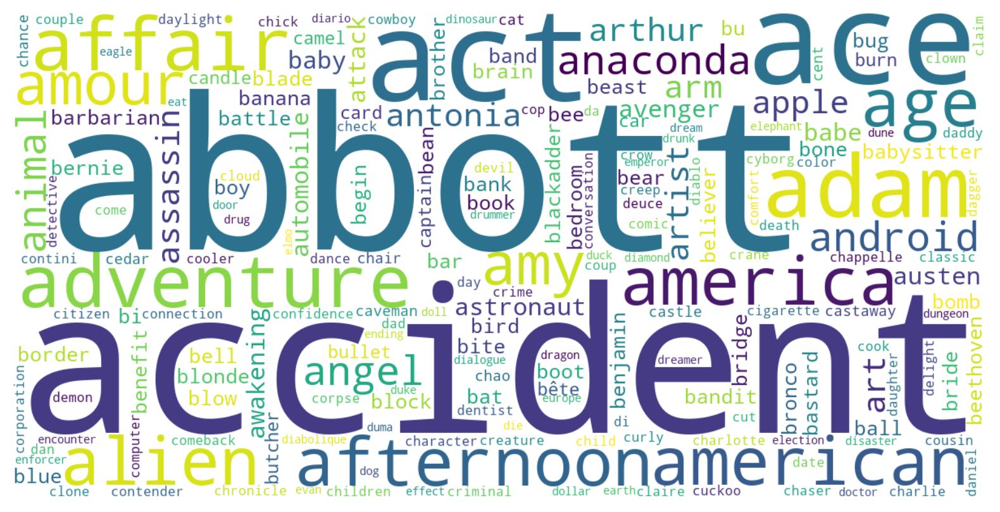

In [18]:
# Extracting words from the table
words = [row[0] for row in table[:-1]]  # Exclude the "Total words" row

# Creating a word cloud
wordcloud = WordCloud(width=1200, height=600, background_color='white').generate(' '.join(words))

# Displaying the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Now that we have a TF matrix set up, we can move on to the actual model. Rather than using the `cosine_similarity` function, I opted to use `linear_kernel`, mostly for performance reasons. `linear_kernel` will be in charge of calculating the cosine similarity bewteen the items in our matrix.

In [42]:
similarity = linear_kernel(matrix, matrix)

Now that we have a cosine similarity matrix for all the movies in the set, we can build a 1-dimensional array for the movies's indices. To build this, I will need the [pandas Series()](https://pandas.pydata.org/docs/reference/api/pandas.Series.html) function.

In [43]:
indices = pd.Series(movies.index, index=movies['title'])

<hr></hr>

The last step is to display the recommendations. For this, I have built a function that returns the top 10 movies that are most similar to the input movie based on cosine similarity scores. This function works by:
- First taking a `title` parameter.
- Checks if the input movie title exists in the dataset.
- If the check above passes, it finds the corresponding `movieID` using a pre-calculated matrix of cosine similarity scores.
- Use the `movieId` to obtain a list of similarity scores for all movies in the dataset. 
- The list is then sorted based on the similarity scores, with the most similar movies listed first.
- Create a dataframe hat contains the titles and similarity scores of the top 10 similar movies and returns it.
- Function is then run separately to dispay results

In [44]:
def cos_sim_movie_recs(title):
    # Check if movie matches exist within the dataset
    matches = movies[movies['title'].str.contains(title, case=False)]
    
    if not matches.empty:
        # Take the first matching title
        title = matches['title'].iloc[0]
        
        # Find movie ID
        idx = indices[title]
        
        # Get similarity scores for provided ID
        similar = list(enumerate(similarity[idx]))
        
        # Sort all movies based on similarity scores
        similar = sorted(similar , key=lambda x: x[1], reverse=True)
        
        # Take the top 10 closest items
        similar = similar[:11]
        
        # Create a DataFrame to store the results
        result = pd.DataFrame({
            'Title': [movies['title'].iloc[i[0]] for i in similar],
            'Similarity': [i[1] for i in similar]
        })
        
        return result
    else:
        return f"Cannot find movie referring to {title}"

<hr></hr>

In [45]:
cos_sim_movie_recs("Iron Man")

,Title,Similarity
0,Iron Man (2008),1.000000
1,Iron Man 2 (2010),0.753501
2,Iron Man 3 (2013),0.711122
3,Iron Will (1994),0.568513
4,Iron Man (1931),0.559386
5,"Man with the Iron Fists, The (2012)",0.550178
6,Iron Sky (2012),0.536674
7,Iron Soldier (2010),0.535225
8,"Man in the Iron Mask, The (1998)",0.498829
9,Never Back Down (2008),0.458129


In [46]:
cos_sim_movie_recs("Toy Story")

,Title,Similarity
0,Toy Story (1995),1.000000
1,Toy Story 2 (1999),0.686386
2,"Bug's Life, A (1998)",0.512102
3,Toy Story 3 (2010),0.471520
4,"Toy, The (1982)",0.311255
5,Up (2009),0.290644
6,Fun (1994),0.273162
7,We're Back! A Dinosaur's Story (1993),0.262240
8,Now and Then (1995),0.243830
9,Toy Soldiers (1991),0.233029


In [47]:
cos_sim_movie_recs("Lion King, The")

,Title,Similarity
0,"Lion King, The (1994)",1.000000
1,Aladdin (1992),0.408205
2,Beauty and the Beast (1991),0.391052
3,Dumbo (1941),0.382246
4,Pinocchio (1940),0.378885
5,Cinderella (1950),0.376950
6,Fantasia (1940),0.371671
7,Pete's Dragon (1977),0.369143
8,"Jungle Book, The (1967)",0.368798
9,"Aristocats, The (1970)",0.356618


<hr></hr>

## Summary

This model seems to do a really good job at recommending movies from the `Animation` genre, but falls a bit short for `Action` movies, as seen in the case of `Iron Man`.

Wrapping up this filtering method, I'll delete the previously used dataframes in preparation for the next recommendation method.

In [48]:
# Deleting the created dataframes for memory management
del movies, tags

# Using python's gc (Garbage Collection) to free space
gc.collect()

20

<hr></hr>

# Hybrid System

During the introduction stage of this notebook, I mentioned the implementation of the [Hybrid System](#challenge-idea). There are many types of these systems that can be implemented, but research suggests that `Feature Augumentation` will work best in our use case. A recommendation system of this kind has the capability to enhance the outcomes and efficacy of the primary system, without requiring any alterations to the main recommendation algorithm. The mechanism works by generating a rating or classification for a specific item, which is then incorporated into the primary recommendation algorithm to yield an improved final output.

For our project, we will implement K-Means clustering to categorize our movies into distinct clusters. Subsequently, we will extract supplementary data from these clusters and integrate it into our primary recommendation system, which will utilize Content-based filtering as the underlying methodology in the notebook.

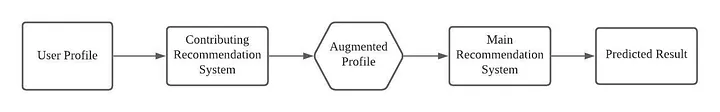

*`Sources used:`*

*Chiang, J. (2021, June 30). 7 types of hybrid recommendation system. Medium.*

*Retrieved April 24, 2023, from https://medium.com/analytics-vidhya/7-types-of-hybrid-recommendation-system-3e4f78266ad8*

We'll start off this step by re-importing our datasets.

In [49]:
# Re-importing the dataframes
ratings = pd.read_csv("./assets/ml-latest/ratings.csv")
movies = pd.read_csv("./assets/ml-latest/movies.csv")
tags = pd.read_csv("./assets/ml-latest/tags.csv")

<hr></hr>

## Preprocessing

The first step in this preprocessing step is to clean up the data. For this we'll be using the [pandas' drop()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html) function to remove the `rating` and `timestamp` columns from the `ratings` dataframe. Said column will not be useful towards the recommendations.

Afterwards, we'll continue by removing movies with less than 50 ratings and under 1000 reviews. This will be achieved by using `pandas'` [value_counts()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html) and [isin()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.isin.html) functions.

Next up, we'll need to reset the index of the dataframe. This is necessary in order to perform correct dataframe merges, hence needed in this case because of the cluster merging that will be done in the steps below. This is achieved by using [pandas' reset_index()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html) function.

Following that, we'll drop all the rows with null cells using [pandas' dropna()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dropna.html) function.

We'll finish off this step by removing the duplicate entries using the [pandas' drop_duplicates()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop_duplicates.html) function and printing out the ratings dataframe.

In [50]:
# Drop unnecessary columns
ratings = ratings.drop(["rating", "timestamp"], axis=1)

# Remove movies with less than 100 ratings
counts_movies = ratings['movieId'].value_counts()
ratings = ratings[~ratings['movieId'].isin(counts_movies[counts_movies < 100].index)]

# Remove users with less than 1500 reviews
counts_users = ratings['userId'].value_counts()
ratings = ratings[~ratings['userId'].isin(counts_users[counts_users < 1500].index)]

# Drop duplicates
ratings = ratings.drop_duplicates()

# Resetting index
ratings = ratings.reset_index().drop(columns="index")

# Dropping rows with null cells
ratings = ratings.dropna()

ratings

,userId,movieId
0,214,1
1,214,3
2,214,6
3,214,10
4,214,11
...,...,...
1681773,283000,185473
1681774,283000,187541
1681775,283000,187593
1681776,283000,187723


<hr></hr>

Next up, we'll be creating a [Crosstab Matrix](https://pandas.pydata.org/docs/reference/api/pandas.crosstab.html) for the `user` and `movie Id's`. Instead of using pandas' default `crosstab()`  function, we'll instead be using the [groupby()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.groupby.html), [count()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.count.html), [unstack()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.unstack.html) and [fillna()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.fillna.html) to achieve the same result. This is mostly done due to performance reasons. By hand-crafting the crosstab matrix itself, we go down from a 2 minute runtime down to a second and a half.

In [51]:
# Create a crosstab matrix for the data
user_movie = ratings.groupby(['movieId', 'userId'])['userId'].count().unstack().fillna(0)
user_movie

userId,214,235,239,1272,1933,2025,2040,2150,2294,2329,...,278527,278817,280148,280585,280868,281438,281631,281790,282172,283000
movieId,,,,,,,,,,,,,,,,,,,,,
1,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0
3,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189363,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
189713,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
191351,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<hr></hr>

Wrapping this step up, we'll first need to remove movies that have not been rated by users. To achieve this, we'll load the `movies` dataframe into a [set](https://www.w3schools.com/python/python_sets.asp), then use the [difference()](https://www.w3schools.com/python/ref_set_difference.asp#:~:text=The%20difference()%20method%20returns,and%20not%20in%20both%20sets.) function on the `ratings` dataframe. The purpose of this operation is to compute the difference between the two created `sets`. This returns a `set` of `movieIDs` that are in the `movies` dataframe but not in the `ratings` dataframe. This is done in order to avoid the predicions becoming strictly content based. Secondly, we'll remove the found movies from the matrix.

In [52]:
# Find movies that exist only in our `movies` dataframe
movies_only = movies[~movies['movieId'].isin(ratings['movieId'])]

# Keep only movies that exist in both dataframes
movies = movies[movies['movieId'].isin(ratings['movieId'])]
movies

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
56364,189363,Ocean's 8 (2018),Action|Comedy|Crime|Thriller
56516,189713,BlacKkKlansman (2018),Comedy|Crime|Drama
57120,191351,To All the Boys I've Loved Before (2018),Comedy|Romance
57281,191799,Extinction (2018),Sci-Fi


<hr></hr>

## Dimensionality Reduction with Principal Component Analysys (PCA)

Before we talk about `PCA`, I'd like to first touch on the concept of `Dimensionality` and `Dimensionality Reduction`. In `Machine Learning`, `Dimensionality` is referred to as the `number of features` or `input variables` that are present in a given dataset. `Dimensionality Reduction` refeers to the process of reducing the number of attributes in a dataset while keeping as much of the variation in the original dataset as possible. This is part of the `Preprocessing` stage, thus it needs to be done before the model can be trained. There are a number of advatages and disadvantages that this method provides, some of them being:

##### Advantages:
- `Lower training times`: This happens in part due to the reduction in data dimensions and data size.
- `Avoids overfitting`: By having too many features, algorithms tend to overfit the training data.
- `Removes noise in the data`: This is achieved by removing most of the unnecessary features, and only keeping the important features for modelling.
- `Helps with the problem of multicollinearity`: When one or more independent variables show a high level of correlation with each other, it leads to a phenomenon called `multicollinearity`. To tackle this issue, dimensionality reduction techniques can be utilized to group those correlated variables into a set of new variables that are not correlated with each other.

##### Disadvantages:
- `Loss of some data`: During the reduction process, some data is due to be lost, therfore impacting training accuracy of future algorithms that are going to be trained on this data.
- `Independent variables become harder to comprehend as a result`
- `Scaling`: PCA makes the assumption that the data is scaled and centralized, which can be a drawback.

`PCA` is a popular `unsupervised learning technique` for reducing the `dimensionality of data`. It transforms a set of correlated variables into a smaller `k` number of uncorrelated variables called `principal components` while retaining as much of the variation in the original dataset as possible. `Principal Components` are a straight line that captures most of the variance of the data. They have a `direction` and `magnitude`. 

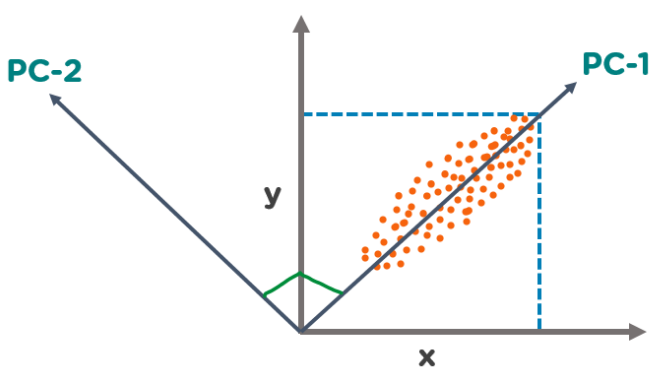

*`Sources:`*

- *Pramoditha, R. (2021, September 28). 11 dimensionality reduction techniques you should know in 2021. Medium.* 
  - *Retrieved May 1, 2023, from https://towardsdatascience.com/11-dimensionality-reduction-techniques-you-should-know-in-2021-dcb9500d388b*
- *Simplilearn. (2023, March 7). What is dimensionality reduction? overview, and popular techniques. Simplilearn.com.*
  - *Retrieved May 1, 2023, from https://www.simplilearn.com/what-is-dimensionality-reduction-article#:~:text=Dimensionality%20reduction%20brings%20many%20advantages,features%20require%20less%20computation%20time*
- *Biswal, A. (2023, April 24). Principal Component Analysis in machine learning: Simplilearn. Simplilearn.com.*
  - *Retrieved May 1, 2023, from https://www.simplilearn.com/tutorials/machine-learning-tutorial/principal-component-analysis*

*`For further reference:`*
- *https://medium.com/data-science-365/statistical-and-mathematical-concepts-behind-pca-a2cb25940cd4*
- *https://medium.com/data-science-365/principal-component-analysis-pca-with-scikit-learn-1e84a0c731b0*
- *https://medium.com/analytics-vidhya/importance-of-dimensionality-reduction-d6a4c7289b92*
- *https://www.keboola.com/blog/pca-machine-learning#:~:text=Principal%20Component%20Analysis%20(PCA)%20is,-noising,%20and%20plenty%20more.*
- *https://towardsdatascience.com/multicollinearity-why-is-it-bad-5335030651bf#:~:text=Multicollinearity%20is%20the%20presence%20of,where%20independent%20variables%20are%20correlated.*

*`Glossary:`*
- Multicollinearity - The presence of high correlations between two or more independent variables.

<hr></hr>

In [53]:
pca = PCA(n_components = 3)
pca.fit(user_movie)
pca_samples = pca.transform(user_movie)

# Transform the result to a dataframe
tocluster = pd.DataFrame(pca_samples)

tocluster

,0,1,2
0,20.416070,0.226571,0.348161
1,16.764589,1.094276,-3.370439
2,8.730532,-2.522840,-4.465339
3,-0.932003,-2.513165,-1.833669
4,8.000649,-1.359746,-4.852730
...,...,...,...
10495,-3.933781,1.571848,0.405880
10496,-4.886587,0.457897,0.191607
10497,-5.437885,0.236800,-0.360693
10498,-4.806352,0.992168,-0.677187


<hr></hr>

## K-Means Clustering

`K-Means Clustering` works by grouping similar data points together with the aim of finiding underlying patterns. K-Means requires a `k` target number. This target represents the `centroids` that we will need in the dataset. The algorithm works by identifying the `k-number of centroids`, then allocate every data point to the nearest `cluster`, all while keeping the `centroids` as small as possible. Finally, the `means` is referring to the `averaging of the data`.

*`Sources:`*

- *(LEDU), E. E. (2018, September 12). Understanding K-means clustering in machine learning. Medium.* 
  - *Retrieved May 1, 2023, from https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1*

*`For further reference:`*
- *https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html*
- *https://towardsdatascience.com/k-means-clustering-with-scikit-learn-6b47a369a83c*

*`Glossary:`*
- Centroids: The imaginary or real location representing the center of the cluster. The `K-value` directly represents these centroids.

<hr></hr>

### Figuring out the correct K-value

To calculate the correct K-value for the clusters, we will be using both the Elbow and Silhouette methods. In order to do this, we will have to build two functions that calculate said methods respectively.

### The Elbow Method

The Elbow Method is a heuristic technique that involves plotting the values of the within-cluster sum of squares (inertia) for different values of K and identifying the "elbow point" on the graph where the change in inertia begins to level off. This point represents the optimal number of clusters.   

### The Silhouette Coefficient

The Silhouette Method is another technique for determining the optimal number of clusters based on the quality of the clusters. It involves calculating the silhouette score for different values of K, which measures how similar an object is to its own cluster compared to others. A higher silhouette score indicates that the object is well-matched to its own cluster and poorly-matched to neighboring clusters, suggesting a better clustering. In order to calculate `intertias` of the sihlhouette coefficients, we'll use a similar approach to the one used to calculate the `Elbow Method` inertias.

### How these functions work

In the `Elbow Method's` case: 
- First we initialize an empty `elbow` list to store the inertia values for different values of `K`. 
- Loop over values of `K` from `1 to 9`. 
- Initializes a `KMeans` object with the current value of `K`.
- Fit the `KMeans` model to the `tocluster` dataset.
- Calculate the `inertia` of the model. 
- `Inertia` value is then appended to the `elbow` list.

In the Silhouette Method's case:
- First we initialize an empty `silhouette` list  to store scores for different values of `K`. 
- Loop over values of `K` from `2 to 9`.
- Initialize a `KMeans` object with the current value of `K`, 
- Fit the `KMeans` model to the `tocluster` dataset.
- Calculate the `silhouette` score of the model using the [sklearn.metrics silhouette_score()](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html) function. 
- The silhouette score is then appended to the `silhouette` list.

*`For further reference:`*
- *https://towardsdatascience.com/how-to-find-the-optimal-value-of-k-in-knn-35d936e554eb#:~:text=The%20optimal%20K%20value%20usually,be%20aware%20of%20the%20outliers.*
- *https://en.wikipedia.org/wiki/Elbow_method_(clustering)#:~:text=In%20cluster%20analysis,%20the%20elbow,number%20of%20clusters%20to%20use.*
- *https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/*
- *https://towardsdatascience.com/silhouette-coefficient-validating-clustering-techniques-e976bb81d10c*
- *https://en.wikipedia.org/wiki/Silhouette_(clustering)*

In [54]:
# Calculating optimal K-value using the Elbow Method
elbow = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(tocluster)
    elbow.append(kmeans.inertia_)

# Calculating optimal K-value using the Silhouette Method
silhouette = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k)
    labels = kmeans.fit_predict(tocluster)
    score = silhouette_score(tocluster, labels)
    silhouette.append(score)

<hr></hr>

## Visualizing the calculations of the Elbow and Silhouette Coefficient

Afterwards, we'll plot the previous results in order to show the results of the functions above. From the visualizations, we can observe that the optimal `K-value` falls around 4 for both calculations. Therefore, we can use that `K-value` for the `Modeling` step.

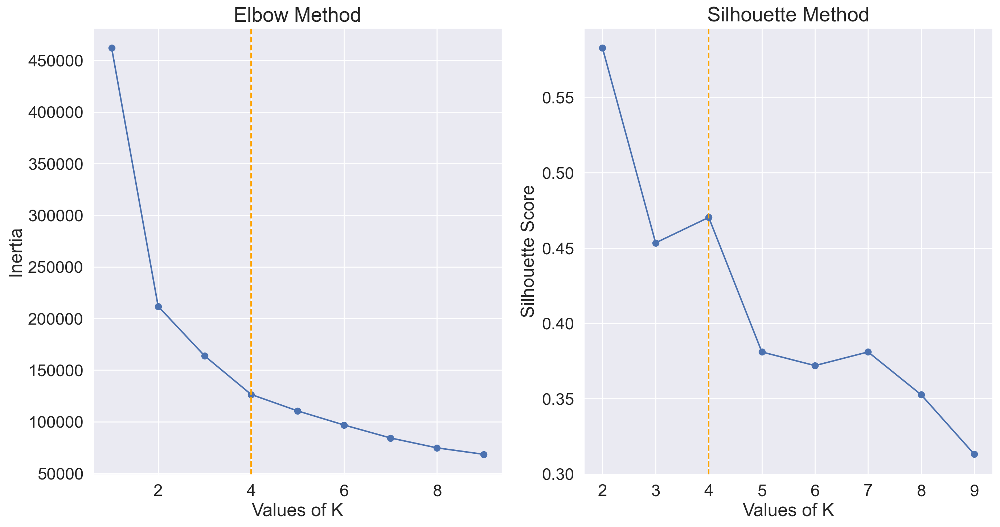

In [55]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))

# Plot Elbow Method
ax[0].plot(range(1, 10), elbow, '-o')
ax[0].axvline(x=4, linestyle='--', color='orange')
ax[0].set_title('Elbow Method', fontsize=20)
ax[0].set_xlabel('Values of K')
ax[0].set_ylabel('Inertia')

# Plot Silhouette Method
ax[1].plot(range(2, 10), silhouette, '-o')
ax[1].axvline(x=4, linestyle='--', color='orange')
ax[1].set_title('Silhouette Method', fontsize=20)
ax[1].set_xlabel('Values of K')
ax[1].set_ylabel('Silhouette Score')

plt.show()

<hr></hr>

## Modeling

### Training K-means

We'll start off by training the [Kmeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html) model. From the visualizations above, it's safe to assume that `4` is the right number of `clusters` to use, but the rest of the hyperparameters will be chosen by [sklearn's GridSearchCV()](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).

The hyperparameters I chose to use are as follows:
- `n_clusters`: The number of clusters to form as well as the number of centroids to generate. This usually defaults at 8, but we can hard-set it to 4, because of the calculations made above.
- `n_init`: Number of times the k-means algorithm is run with different centroid seeds. The final results is the best output of n_init consecutive runs in terms of inertia.
- `init`:
  - `k-means++`: Selects initial cluster centroids using sampling based on an empirical probability distribution of the points’ contribution to the overall inertia.
  - `random`: Choose `n_clusters` observations at random from data for the initial centroids. If an array is passed, it should be of shape `(n_clusters, n_features)` and gives the initial `centers`.
- `random_state`: Determines random number generation for centroid initialization. 


In [56]:
# Define the parameter grid for Grid Search
param_grid = {
    'n_clusters': [4],
    'n_init': [10, 20],
    'init': ['k-means++', 'random'],
    'random_state': [42]
}

# Create a KMeans instance
kmeans = KMeans()

# Create a GridSearchCV object
grid_search = GridSearchCV(kmeans, param_grid, cv=5)

# Fit the GridSearchCV object to the data
grid_search.fit(tocluster)

# Print the best parameters
print("Best Parameters: ", grid_search.best_params_)

# Get the best KMeans model
best_kmeans = grid_search.best_estimator_

# Fit the best KMeans model to the data
best_kmeans.fit(tocluster)

# Get the centers and cluster predictions
centers = best_kmeans.cluster_centers_
c_preds = best_kmeans.predict(tocluster)

Best Parameters:  {'init': 'random', 'n_clusters': 4, 'n_init': 10, 'random_state': 42}


### Cluster Visualization

Now that `Kmeans` training is done, we'll plot out the datapoints in correlation to the centroids. We can use [matplotlib's scatterplot](https://matplotlib.org/stable/gallery/shapes_and_collections/scatter.html) to achieve this. 

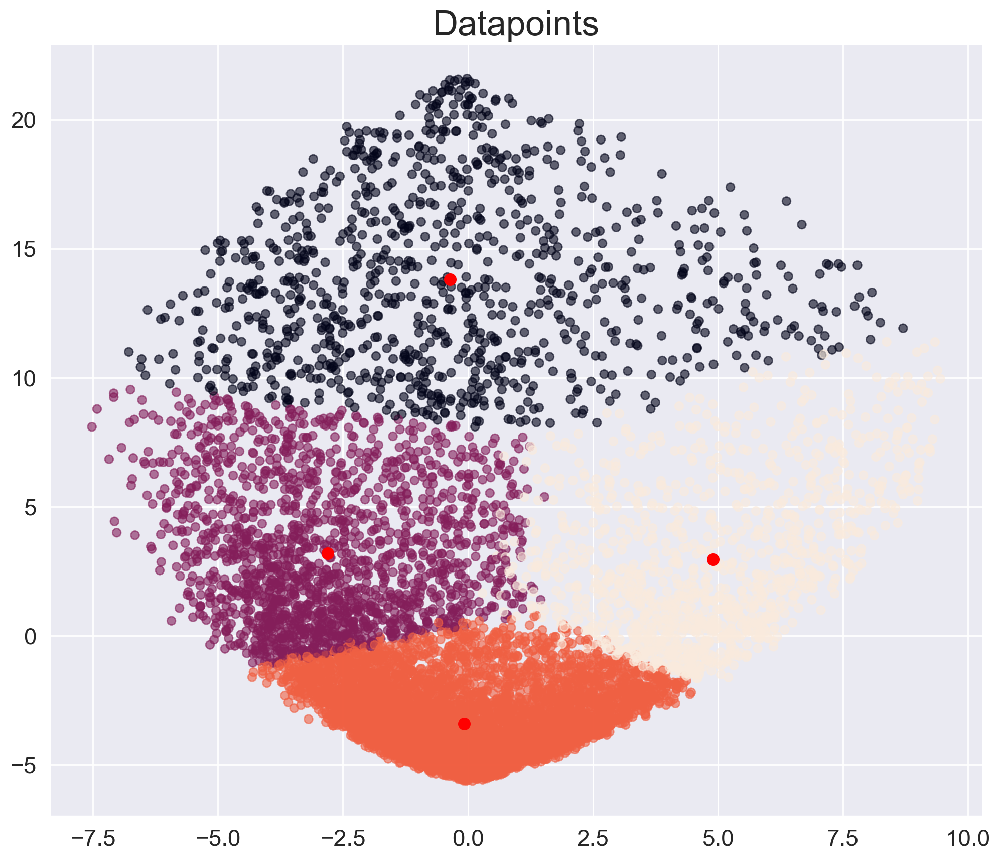

In [57]:
plt.figure(figsize=(12,10))
for index, c in enumerate(centers):
    plt.plot(c[1], c[0], 'o',color='red',alpha=1, markersize=8)
plt.scatter(tocluster[1], tocluster[0], c = c_preds,alpha=0.6)
plt.title('Datapoints', fontsize=25)
plt.show()

The other visualization we'll look at is the `cluster-movie distribution`. For this we'll need to first add a `cluster` column to the `movies` dataframe, and use it in the visualization below.

In [58]:
# Adding the result to our dataframe
movies["cluster"] = c_preds.astype(str)
movies["cluster"] = "Cluster"+movies["cluster"]
movies

,movieId,title,genres,cluster
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,Cluster0
1,2,Jumanji (1995),Adventure|Children|Fantasy,Cluster0
2,3,Grumpier Old Men (1995),Comedy|Romance,Cluster1
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,Cluster2
4,5,Father of the Bride Part II (1995),Comedy,Cluster1
...,...,...,...,...
56364,189363,Ocean's 8 (2018),Action|Comedy|Crime|Thriller,Cluster2
56516,189713,BlacKkKlansman (2018),Comedy|Crime|Drama,Cluster2
57120,191351,To All the Boys I've Loved Before (2018),Comedy|Romance,Cluster2
57281,191799,Extinction (2018),Sci-Fi,Cluster2


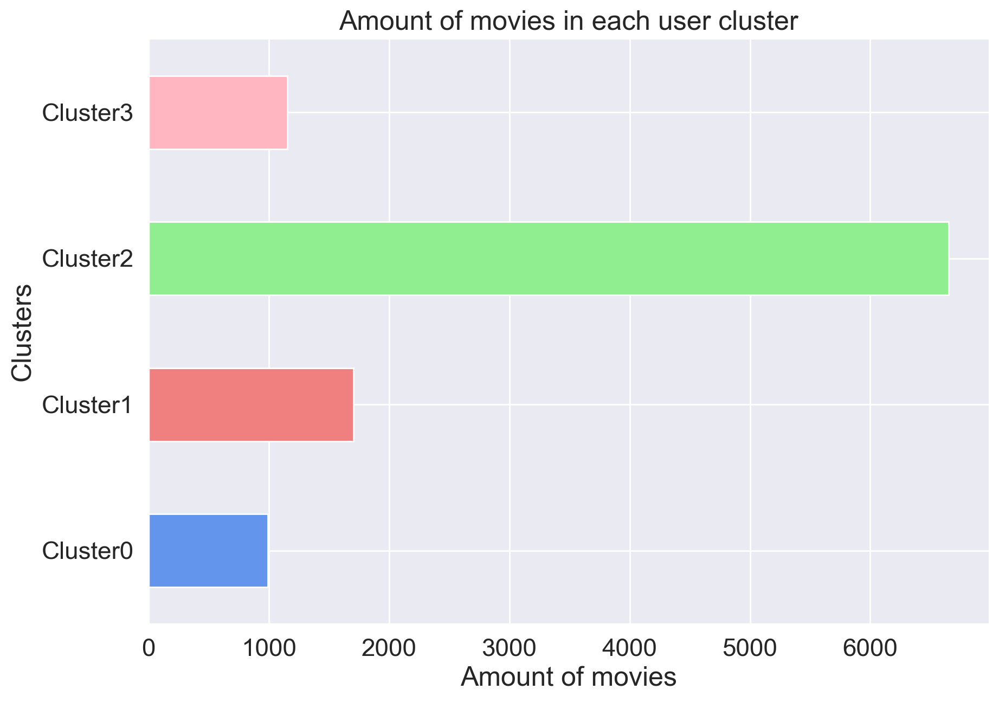

In [59]:
# Define color pallette
colors = ['#6495ED', '#F08080', '#90EE90', '#FFB6C1', '#ADD8E6']

# Create plot
fig, ax = plt.subplots(figsize=(10, 7))
movies['cluster'].value_counts().sort_index().plot(kind='barh', color=colors, ax=ax)

# Set axis labels and title
ax.set_xlabel('Amount of movies')
ax.set_ylabel('Clusters')
ax.set_title('Amount of movies in each user cluster')

# Remove top and right borders
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Display plot
plt.show()

### Text Vectorization

Moving on, we'll be following a similar approach as the one used in [Content Based Filtering](#content-based-filtering)'s case. We'll need `cosine similarity` scores in order to display the results on screen, therefore, all the explanations about `TF-IDF` and `Cosine Similarity` apply here as well.

In order to prepare the data for training, we first need to remove all the `non letter characters` from the `titles` and `genres`. In order to make this easier to visualize, we'll add said extracted `titles` and `genres` to the `filtered_titles` and `filtered_genres` columns repectively. 

Afterwards, we'll merge the columns created above to create `fullcol` once more.

Finally, we'll remove the stopwords, and whitespaces, and wrap up my resetting the index using [pandas' reset_index()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html).

In [60]:
# Remove non-letter characters from title and genres columns
movies["filtered_titles"] = movies["title"].apply(lambda x: re.sub(r'[^a-zA-Z ]+', ' ', x))
movies["filtered_genres"] = movies["genres"].apply(lambda x: re.sub(r'[^a-zA-Z ]+', ' ', x))

# Combine title, cluster, and genres into one column
movies["fullcol"] = movies["filtered_titles"] + " " + movies["cluster"] + " " + movies["filtered_genres"]

# Remove stopwords and extra whitespace from the overview column
movies["fullcol"] = movies["fullcol"].apply(lambda x: remove_stopwords(x).strip())

# Reset the index of the dataframe
movies = movies.reset_index(drop=True)

movies

,movieId,title,genres,cluster,filtered_titles,filtered_genres,fullcol
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,Cluster0,Toy Story,Adventure Animation Children Comedy Fantasy,Toy Story Cluster0 Adventure Animation Childre...
1,2,Jumanji (1995),Adventure|Children|Fantasy,Cluster0,Jumanji,Adventure Children Fantasy,Jumanji Cluster0 Adventure Children Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance,Cluster1,Grumpier Old Men,Comedy Romance,Grumpier Old Men Cluster1 Comedy Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,Cluster2,Waiting to Exhale,Comedy Drama Romance,Waiting Exhale Cluster2 Comedy Drama Romance
4,5,Father of the Bride Part II (1995),Comedy,Cluster1,Father of the Bride Part II,Comedy,Father Bride Part II Cluster1 Comedy
...,...,...,...,...,...,...,...
10495,189363,Ocean's 8 (2018),Action|Comedy|Crime|Thriller,Cluster2,Ocean s,Action Comedy Crime Thriller,Ocean s Cluster2 Action Comedy Crime Thriller
10496,189713,BlacKkKlansman (2018),Comedy|Crime|Drama,Cluster2,BlacKkKlansman,Comedy Crime Drama,BlacKkKlansman Cluster2 Comedy Crime Drama
10497,191351,To All the Boys I've Loved Before (2018),Comedy|Romance,Cluster2,To All the Boys I ve Loved Before,Comedy Romance,To All Boys I ve Loved Before Cluster2 Comedy ...
10498,191799,Extinction (2018),Sci-Fi,Cluster2,Extinction,Sci Fi,Extinction Cluster2 Sci Fi


In [61]:
# Pass all the rows to a local variable
fullcol = movies["fullcol"]

# Initialize TfidfVectorizer
tfidf = TfidfVectorizer(analyzer='word', stop_words='english', min_df=0)
gc.collect()

# Generate a tf-idf vector matrix
tfidf_matrix = tfidf.fit_transform(fullcol)

## Training Cosine Similarity

In [62]:
# Compute similarities between movies
cos_similar = linear_kernel(tfidf_matrix , tfidf_matrix)

# Series of movies(indices)
indices = pd.Series(movies.index , index = movies['title']).drop_duplicates()

print(cos_similar.shape)

(10500, 10500)


## Results

In order to display the results, we'll have to build another function. This one works by:
- First check if there is a movie title in the dataset that matches the input title. 
- If there is a match, find the movie's ID.
- Get the similarity score between that movie and all other movies in the dataset using the cosine similarity matrix.
- Sort the movies based on their similarity scores.
- Take the top 10 closest movies, and creates a dictionary with the movie titles and their similarity scores.
- Return the dictionary as a [pandas DataFrame](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)

This function will then be run separately in order to print the results.

In [63]:
def hybrid_recs(title):
    
    # Check if movie matches exist within our dataset (DataFrame)
    validation = indices.index.str.contains(title, case=False)
    if validation.any():
        # Find the first matching movie
        title_match = indices[validation].index[0]

        # Get movie ID
        idx = indices.loc[title_match]

        # Get similarity score for provided ID
        similar = list(enumerate(cos_similar[idx]))

        # Sort all movies based on similarity scores
        similar = sorted(similar, key=lambda x: x[1], reverse=True)

        # Take the Top 10 closest items
        similar = similar[:11]

        # Create a dictionary with titles and distances
        state = {"Title": [movies.iloc[i[0]]['title'] for i in similar],
                 "Similarity": [i[1] for i in similar]}
        
        # Return the dictionary as a DataFrame
        return pd.DataFrame.from_dict(state)
    else:
        return f"Cannot find movie referring to {title}"

In [64]:
hybrid_recs('Iron Man')

,Title,Similarity
0,Iron Man (2008),1.000000
1,Iron Man 2 (2010),0.891606
2,Iron Man 3 (2013),0.774075
3,"Man in the Iron Mask, The (1998)",0.711422
4,Iron Will (1994),0.689047
5,"Iron Giant, The (1999)",0.613788
6,"Man with the Iron Fists, The (2012)",0.609220
7,Iron Sky (2012),0.608853
8,Spider-Man (2002),0.550891
9,Demolition Man (1993),0.526438


In [65]:
hybrid_recs('Toy Story')

,Title,Similarity
0,Toy Story (1995),1.000000
1,Toy Story 2 (1999),1.000000
2,Toy Story 3 (2010),0.928292
3,Toy Story of Terror (2013),0.731476
4,Toy Story That Time Forgot (2014),0.618590
5,"Toy, The (1982)",0.608466
6,Tin Toy (1988),0.576304
7,Up (2009),0.531400
8,We're Back! A Dinosaur's Story (1993),0.519182
9,"NeverEnding Story, The (1984)",0.503467


In [66]:
hybrid_recs('Lion King, The')

,Title,Similarity
0,"Lion King, The (1994)",1.000000
1,"Lion King 1½, The (2004)",0.823486
2,"Lion King II: Simba's Pride, The (1998)",0.602271
3,Lion (2016),0.576648
4,"King and I, The (1999)",0.567920
5,Up (2009),0.510366
6,"King and I, The (1956)",0.483522
7,"Wind and the Lion, The (1975)",0.456190
8,"Lion in Winter, The (1968)",0.421445
9,Beauty and the Beast (1991),0.405988


## Evaluation

Due to the way this project is structured, we'll have to be a bit creative with the evaluation method. Throughout this notebook, we ran the recommendation functions for the same three titles, and now, we'll be adding them to an array of scores and compare each `Filtering Method's` accuracy.  

How the scoring system will work:
- Movies will be awarded up to three points, following these rules:
  - If the movie is `unrelated` - 0 points.
  - Movie is from a `similar` genre - 1 point.
  - Movie is part of a `franchise` - 2 points.
  - Movie is a `sequel, prequel or spinoff` - 3 points.


In [67]:
# Collaborative
res11 = [1,2,2,0,1,1,3,2,0,1] # Iron Man
res12 = [0,0,0,0,2,0,0,0,0,3] # Toy Story
res13 = [1,0,0,0,0,0,0,0,1,1] # The Lion King

# Content
res21 = [3,3,3,0,1,0,0,0,0,0] # Iron man
res22 = [3,3,1,3,0,1,0,0,0,0] # Toy Story
res23 = [3,1,1,1,1,1,1,1,1,1] # The Lion King

# Hybrid
res31 = [3,3,3,0,1,0,1,0,2,2] # Iron Man
res32 = [3,3,3,0,0,1,1,1,1,0] # Toy Story
res33 = [3,3,3,0,1,0,0,1,1,0] # The Lion King

After adding the results to the arrays, we'll need to normalize the results.

In [68]:
for x in range(1,4):
    for y in range(1,4):
        globals()['res%s%s_normalized' %(x, y)] = minmax_scale(globals()['res%s%s' %(x, y)])

for x in range(1, 4):
    for y in range(1, 4):
        globals()['score%s%s' % (x, y)] = (sum(globals()['res%s%s_normalized' % (x, y)]) / len(globals()['res%s%s_normalized' % (x, y)]))*100   

### Results

After the results have been normalized, we'll print out said results in an easy to understand manner.

In [69]:
algorithms = [("Collaborative Filtering", score11, score12, score13), 
              ("Content Filtering", score21, score22, score23), 
              ("Hybrid Filtering", score31, score32, score33)]

for algorithm, score1, score2, score3 in algorithms:
    print(algorithm)
    print(f"Iron Man - {score1:.2f}%")
    print(f"Toy Story - {score2:.2f}%")
    print(f"The Lion King - {score3:.2f}%")
    avg_score = (score1 + score2 + score3) / 3
    print(f"Average Algorithm Accuracy - {avg_score:.2f}%")
    print("---------------------------------------------")


Collaborative Filtering
Iron Man - 43.33%
Toy Story - 16.67%
The Lion King - 30.00%
Average Algorithm Accuracy - 30.00%
---------------------------------------------
Content Filtering
Iron Man - 33.33%
Toy Story - 36.67%
The Lion King - 10.00%
Average Algorithm Accuracy - 26.67%
---------------------------------------------
Hybrid Filtering
Iron Man - 50.00%
Toy Story - 43.33%
The Lion King - 40.00%
Average Algorithm Accuracy - 44.44%
---------------------------------------------


## Summary

From the results above, we can see that the `Hybrid System` performs best, since it includes both user and movie data, thus making this model more accurate. This is in part due to using the strenghts of both `Collaborative and Content Based` filtering to create a model that is moderately accurate in our results, averaging at around `44% accuracy`. Across the three tested movies, we can see that it's scores range from 40-50%. 

Collaborative Filtering comes in second, with almost 29% accuracy. Score wise, it's quite far away from what the Hybrid System was able to achieve, mostly due to it relying on user data to recommend movies. The scores fluctuate way more for this filtering method, since we can see scores as low as 16% and as high as 40%.

Content Filtering bottoms the list, it finishing with about 27% accuracy. The results also fluctuate quite badly, seeing lows of 10% accracy, and highs in the 37% range. This method relies on movie information, and no user input. The lowest is represented by The Lion King. It's results indicate that it can do very good genre prediction, but falls short at identifying sequels and movies closely related to it.

In [70]:
# Deleting the created dataframes for memory management
del ratings, movies, tags

# Using python's gc (Garbage Collection) to free space
gc.collect()

0

# Model-Based Filtering using Singular Value Decomposition (SVD)

The final filtering method we'll be looking at is Model-Based Filtering. This uses a pretty popular dimentionality reduction technique that's heavily used in the industry, called SVD. In order to get a proper understanding of how this algorithm works, we'll need to dive into the mathematical aspect of it.

[SVD](https://surprise.readthedocs.io/en/stable/matrix_factorization.html) is an algorithm that decomposes a matrix `A` into the best lower rank approximation of the original matrix. Mathematically, it decomposes `A` into a two unitary matrices and a diagonal matrix, as shown in the picture below.

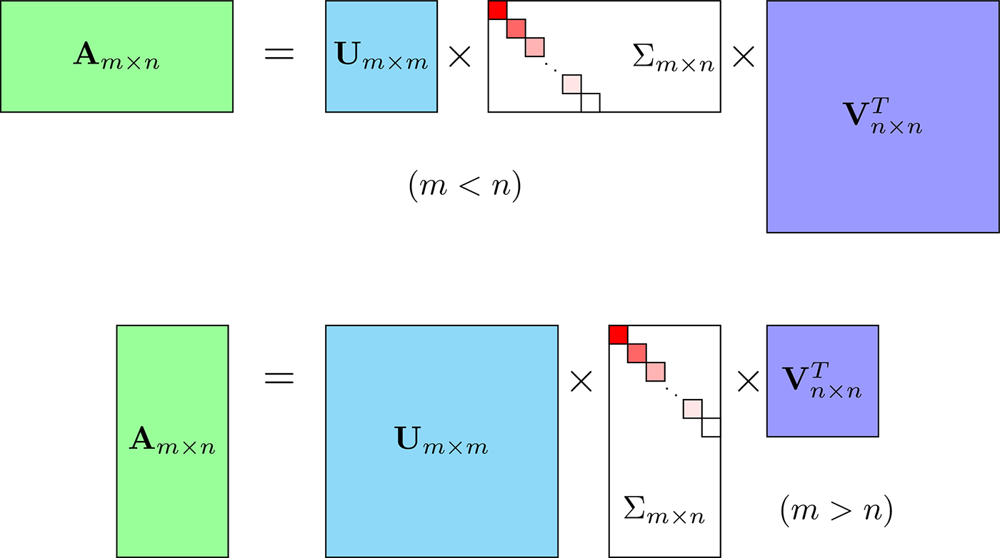

The values represented in the picture above represent the following:
- `A` is the input data matrix.
- `U` are the singular vectors that are left.
- `Σ` is the diagonal matrix of singular values
- `V^T` are the right singular vectors
- `U` represents the user affinity towards each feature of `V^T`

*`Sources:`*

https://12ft.io/proxy?q=https://towardsdatascience.com/singular-value-decomposition-and-its-applications-in-principal-component-analysis-5b7a5f08d0bd#:~:text=SVD%20is%20basically%20a%20matrix,eigenvalues%20and%20eigenvectors%20is%20essential.


I'll start of by reloading the datasets into memory and printing them out in their current state.

In [71]:
ratings = pd.read_csv("./assets/ml-svd/ratings.csv")
movies = pd.read_csv("./assets/ml-svd/movies_1.csv")
users = pd.read_csv("./assets/ml-svd/users.csv")

In [72]:
ratings

,\tuser_id\tmovie_id\trating\ttimestamp\tuser_emb_id\tmovie_emb_id
0,0\t1\t1193\t5\t978300760\t0\t1192
1,1\t1\t661\t3\t978302109\t0\t660
2,2\t1\t914\t3\t978301968\t0\t913
3,3\t1\t3408\t4\t978300275\t0\t3407
4,4\t1\t2355\t5\t978824291\t0\t2354
...,...
1000204,1000204\t6040\t1091\t1\t956716541\t6039\t1090
1000205,1000205\t6040\t1094\t5\t956704887\t6039\t1093
1000206,1000206\t6040\t562\t5\t956704746\t6039\t561
1000207,1000207\t6040\t1096\t4\t956715648\t6039\t1095


In [73]:
movies

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
9737,193581,Black Butler: Book of the Atlantic (2017),Action|Animation|Comedy|Fantasy
9738,193583,No Game No Life: Zero (2017),Animation|Comedy|Fantasy
9739,193585,Flint (2017),Drama
9740,193587,Bungo Stray Dogs: Dead Apple (2018),Action|Animation


In [74]:
users

,\tuser_id\tgender\tage\toccupation\tzipcode\tage_desc\tocc_desc
0,0\t1\tF\t1\t10\t48067\tUnder 18\tK-12 student
1,1\t2\tM\t56\t16\t70072\t56+\tself-employed
2,2\t3\tM\t25\t15\t55117\t25-34\tscientist
3,3\t4\tM\t45\t7\t02460\t45-49\texecutive/manage...
4,4\t5\tM\t25\t20\t55455\t25-34\twriter
...,...
6035,6035\t6036\tF\t25\t15\t32603\t25-34\tscientist
6036,6036\t6037\tF\t45\t1\t76006\t45-49\tacademic/e...
6037,6037\t6038\tF\t56\t1\t14706\t56+\tacademic/edu...
6038,6038\t6039\tF\t45\t0\t01060\t45-49\tother or n...


As we can see, these sets are quite messy, thus we'll delete the current ones and re-import them using proper line separators.

In [75]:
# Deleting the created dataframes for memory management
del ratings, movies, users

# Using python's gc (Garbage Collection) to free space
gc.collect()

0

We'll be using `\t` separators and `latin-1` encoding for importing these sets.

In [76]:
# Re-importing the dataframes
ratings = pd.read_csv("./assets/ml-svd/ratings.csv", sep='\t', encoding='latin-1', usecols=['user_id', 'movie_id', 'rating', 'timestamp'])
movies = pd.read_csv("./assets/ml-svd/movies.csv", sep='\t', encoding='latin-1', usecols=['movie_id', 'title', 'genres'])
users = pd.read_csv("./assets/ml-svd/users.csv", sep='\t', encoding='latin-1', usecols=['user_id', 'gender', 'zipcode', 'age_desc', 'occ_desc'])
gc.collect()

0

In [77]:
movies

,movie_id,title,genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
3878,3948,Meet the Parents (2000),Comedy
3879,3949,Requiem for a Dream (2000),Drama
3880,3950,Tigerland (2000),Drama
3881,3951,Two Family House (2000),Drama


We'll start off by cleaning up the `movies` set by removing the `|` separators inside the genres row, and replacing blanks with `"no genres listed"` or `"NoGenre"`.

In [78]:
movies["genres"]= movies["genres"].str.replace("|"," ",regex=False) 
movies["genres"]= movies["genres"].str.replace("(no genres listed)","NoGenre",regex=False) 


def findGenre(genre):
    return re.findall("(.+?)(?:\s|$)", genre)

movies["genres"] = movies["genres"].apply(findGenre)
movies.head(5)

,movie_id,title,genres
0,1,Toy Story (1995),"[Animation, Children's, Comedy]"
1,2,Jumanji (1995),"[Adventure, Children's, Fantasy]"
2,3,Grumpier Old Men (1995),"[Comedy, Romance]"
3,4,Waiting to Exhale (1995),"[Comedy, Drama]"
4,5,Father of the Bride Part II (1995),[Comedy]


In [79]:
users

,user_id,gender,zipcode,age_desc,occ_desc
0,1,F,48067,Under 18,K-12 student
1,2,M,70072,56+,self-employed
2,3,M,55117,25-34,scientist
3,4,M,02460,45-49,executive/managerial
4,5,M,55455,25-34,writer
...,...,...,...,...,...
6035,6036,F,32603,25-34,scientist
6036,6037,F,76006,45-49,academic/educator
6037,6038,F,14706,56+,academic/educator
6038,6039,F,01060,45-49,other or not specified


In [80]:
ratings

,user_id,movie_id,rating,timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291
...,...,...,...,...
1000204,6040,1091,1,956716541
1000205,6040,1094,5,956704887
1000206,6040,562,5,956704746
1000207,6040,1096,4,956715648


## Preprocessing

I'll start off by counting the unique number of users and movies. To achieve this, I used [python's built-in len() function](https://www.w3schools.com/python/ref_func_len.asp) and [numpy's unique() function](https://numpy.org/doc/stable/reference/generated/numpy.unique.html).

In [81]:
n_users = len(ratings['user_id'].unique())
n_movies = len(ratings['movie_id'].unique())
print(f"Number of users = {n_users} | Number of movies = {n_movies}")

Number of users = 6040 | Number of movies = 3706


Next up, we'll need to make a pivot table where we'll assign one row per `userId` and one column per `movieId`.

In [82]:
Ratings = ratings.pivot(index = 'user_id', columns ='movie_id', values = 'rating').fillna(0)
Ratings.head()

movie_id,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
user_id,,,,,,,,,,,,,,,,,,,,,
1,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Finally, we'll have to `de-normalize` the data, which involves `normalizing` it based on the `mean of each user`, and then transforming it from a `dataframe` into a [numpy array](https://numpy.org/doc/stable/reference/generated/numpy.array.html).

In [83]:
ratings_array = Ratings.values
mean_user_ratings = np.mean(ratings_array, axis=1, keepdims=True)
demeaned_ratings = ratings_array - mean_user_ratings

### SVD Set-up

In [84]:
sparsity = 1 - len(ratings) / (n_users * n_movies)
sparsity_percent = round(sparsity * 100, 3)

print(f"The sparsity level of the dataset is {sparsity_percent}%.")

The sparsity level of the dataset is 95.532%.


To set up SVD, we'll be using [scipy's sparse.linalg.svds](https://docs.scipy.org/doc/scipy/reference/generated/scipy.linalg.svd.html) package, since the data is quite sparse. A benefit of this is the ability to use the `k` parameter, which allows us to compute the number of singular values and singular vectors in the set.

In [85]:
U, sigma, Vt = svds(demeaned_ratings, k = 50)

Since we'll be using matrix multiplication to get our predictions, we'll now convert the <math xmlns="http://www.w3.org/1998/Math/MathML"> 
  <mi mathvariant="normal">&#x3A3;</mi>
</math>
to a diagonal matrix using [numpy's diag](https://numpy.org/doc/stable/reference/generated/numpy.diag.html) function.

In [86]:
sigma = np.diag(sigma)

### Getting predictions from decomposed matrix

We now have everything we need to make movie ratings predictions for every user. We can do it all at once by following the math and matrix multiply `U`, `Σ` and `V^T` to get the rank approxmation of `A`.

In [87]:
all_user_predicted_ratings = np.dot(np.dot(U, sigma), Vt) + mean_user_ratings.reshape(-1, 1)

Next up, we'll make a list of movies that a user has already rated, for further use in the recommendation function we will be building. For this, we'll be creating a new dataframe usng [pandas' DataFrame](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html) function that uses the `all_user_predicted_ratings` array as a source, and sets the column numbers to be the same as the `Ratings` dataframe we used before. 

In [88]:
preds = pd.DataFrame(all_user_predicted_ratings, columns = Ratings.columns)
preds.head()

movie_id,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,4.288861,0.143055,-0.195080,-0.018843,0.012232,-0.176604,-0.074120,0.141358,-0.059553,-0.195950,...,0.027807,0.001640,0.026395,-0.022024,-0.085415,0.403529,0.105579,0.031912,0.050450,0.088910
1,0.744716,0.169659,0.335418,0.000758,0.022475,1.353050,0.051426,0.071258,0.161601,1.567246,...,-0.056502,-0.013733,-0.010580,0.062576,-0.016248,0.155790,-0.418737,-0.101102,-0.054098,-0.140188
2,1.818824,0.456136,0.090978,-0.043037,-0.025694,-0.158617,-0.131778,0.098977,0.030551,0.735470,...,0.040481,-0.005301,0.012832,0.029349,0.020866,0.121532,0.076205,0.012345,0.015148,-0.109956
3,0.408057,-0.072960,0.039642,0.089363,0.041950,0.237753,-0.049426,0.009467,0.045469,-0.111370,...,0.008571,-0.005425,-0.008500,-0.003417,-0.083982,0.094512,0.057557,-0.026050,0.014841,-0.034224
4,1.574272,0.021239,-0.051300,0.246884,-0.032406,1.552281,-0.199630,-0.014920,-0.060498,0.450512,...,0.110151,0.046010,0.006934,-0.015940,-0.050080,-0.052539,0.507189,0.033830,0.125706,0.199244


Finally, we'll build a function that returns the recommended movies. This function works by:
- First taking the parameters of `predictions`, `userID`, `movies`, `original_ratings`, `num_recommendations`.
- Sorting the user's predicted ratings in descending order.
- Retrieving the user's rating history and merges in the movie information.
- Printing out the number of movies the user has already rated and the number of recommendations that will be made.
- Recommending the highest predicted rating movies that the user hasn't seen yet.
- Returning two `dataframes`: 
  - User's full rating history and the 
  - Recommended movies that the user hasn't seen yet.

In [89]:
def recommend_movies_svd(predictions, userID, movies, original_ratings, num_recommendations):
    # Get and sort the user's predictions
    user_row_number = userID - 1
    sorted_user_predictions = predictions.iloc[user_row_number].sort_values(ascending=False)

    # Get the user's data and merge in the movie information.
    user_data = original_ratings[original_ratings.user_id == userID]
    user_full = pd.merge(user_data, movies, on='movie_id').sort_values('rating', ascending=False)
    
    print('User {} has already rated {} movies.'.format(userID, user_full.shape[0]))
    print('Recommending highest {} predicted ratings for movies that are not already rated.'.format(num_recommendations))
    
    # Recommend the highest predicted rating movies that the user hasn't seen yet.
    recommended_movies = movies[~movies.movie_id.isin(user_full.movie_id)]
    recommended_movies = pd.merge(recommended_movies, pd.DataFrame(sorted_user_predictions).reset_index(),
                                 on='movie_id')
    recommended_movies = recommended_movies.rename(columns={user_row_number: 'Predictions'})
    recommended_movies = recommended_movies.sort_values('Predictions', ascending=False).iloc[:num_recommendations, :-1]
    
    return user_full, recommended_movies

Next up, we'll assign data to the `already_rated` and `predictions` variables by running the `recommend_movies_svd` and passing it an integer in the `user` variable, in this case `2610`, thus letting us look at what the user with that ID has rated, and what the algorithms deems that they would like to watch. 

In [90]:
already_rated, predictions = recommend_movies_svd(preds, 2610, movies, ratings, 10)

User 2610 has already rated 46 movies.
Recommending highest 10 predicted ratings for movies that are not already rated.


In [91]:
already_rated.head(10)

,user_id,movie_id,rating,timestamp,title,genres
16,2610,608,5,973722447,Fargo (1996),"[Crime, Drama, Thriller]"
42,2610,2948,5,973722495,From Russia with Love (1963),[Action]
39,2610,2791,5,973722464,Airplane! (1980),[Comedy]
23,2610,110,4,973722464,Braveheart (1995),"[Action, Drama, War]"
35,2610,3555,4,973722333,U-571 (2000),"[Action, Thriller]"
15,2610,293,4,973722495,"Professional, The (a.k.a. Leon: The Profession...","[Crime, Drama, Romance, Thriller]"
14,2610,434,4,973722239,Cliffhanger (1993),"[Action, Adventure, Crime]"
13,2610,3623,4,973725254,Mission: Impossible 2 (2000),"[Action, Thriller]"
34,2610,1931,4,973722239,Mutiny on the Bounty (1935),[Adventure]
37,2610,1035,4,973722514,"Sound of Music, The (1965)",[Musical]


In [92]:
predictions

,movie_id,title,genres
1155,1259,Stand by Me (1986),"[Adventure, Comedy, Drama]"
836,908,North by Northwest (1959),"[Drama, Thriller]"
3469,3753,"Patriot, The (2000)","[Action, Drama, War]"
1407,1544,"Lost World: Jurassic Park, The (1997)","[Action, Adventure, Sci-Fi, Thriller]"
3211,3481,High Fidelity (2000),[Comedy]
1145,1249,Nikita (La Femme Nikita) (1990),[Thriller]
2623,2858,American Beauty (1999),"[Comedy, Drama]"
1961,2160,Rosemary's Baby (1968),"[Horror, Thriller]"
529,551,"Nightmare Before Christmas, The (1993)","[Children's, Comedy, Musical]"
2429,2657,"Rocky Horror Picture Show, The (1975)","[Comedy, Horror, Musical, Sci-Fi]"


## Evaluation

To evaluate this model's performance, I'll be using the [Surprise](https://pypi.org/project/scikit-surprise/) library. This library makes it very easy to visualize and compare results that the implementation of `SVD` has produced. We'll mostly be looking at the `RMSE` (`Root Mean Squared Error`) values that the evaluation produces, which in our case, sit at an average of `0.87`, which is pretty good. These results are way better when put in comparison with what the three filtering methods we looked at prior were able to produce.

In [93]:
# Define the Reader object
reader = Reader()

# Load the data from the pandas dataframe into the reader
data = Dataset.load_from_df(ratings[['user_id', 'movie_id', 'rating']], reader)

# Define the use of SVD for validation
algo = SVD()

# Run 5-fold cross-validation and print results.
cross_validate(algo, data, measures=['RMSE', 'MAE'], cv=5, verbose=True)

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.8734  0.8747  0.8723  0.8742  0.8738  0.8736  0.0008  
MAE (testset)     0.6860  0.6863  0.6850  0.6863  0.6859  0.6859  0.0005  
Fit time          9.37    9.09    8.91    8.96    9.75    9.22    0.31    
Test time         1.82    1.70    1.76    1.73    2.19    1.84    0.18    


{'test_rmse': array([0.8733778 , 0.87467267, 0.87225865, 0.87416764, 0.87376872]),
 'test_mae': array([0.6859942 , 0.68631992, 0.68495888, 0.68634254, 0.6859365 ]),
 'fit_time': (9.369083166122437,
  9.09105896949768,
  8.91019892692566,
  8.95962405204773,
  9.75198483467102),
 'test_time': (1.8214788436889648,
  1.7041890621185303,
  1.7618329524993896,
  1.7318427562713623,
  2.194521903991699)}

The final thing that we'll be doing is to train the data and get the predicted user ratings.

In [94]:
trainset = data.build_full_trainset()
algo.fit(trainset)

In [95]:
ratings[ratings['user_id'] == 2610]

,user_id,movie_id,rating,timestamp
428912,2610,3937,3,973725168
428913,2610,589,4,973722426
428914,2610,3,3,973722629
428915,2610,1426,1,973722718
428916,2610,760,3,973722239
428917,2610,2291,2,973722560
428918,2610,2454,3,973725097
428919,2610,2455,2,973722560
428920,2610,3408,2,973722333
428921,2610,1673,2,973722464


We can see that for `movieId` `1569`, we get an estimated rating of about `3.12 stars`. This prediction is based on how other users have rated the movie, in correlation to the given user. 

In [96]:
algo.predict(2610, 1569)

Prediction(uid=2610, iid=1569, r_ui=None, est=3.2779137403833922, details={'was_impossible': False})

### Experimental

As a final experiment, we'll run a `Grid Search` on the same set, but with different parameters, to see if we can get better `RMSE` scores. The `hyperparameters` we'll load in the grid are:
- `n_epochs`: The number of iteration of the SGD procedure.
- `lr_all`: The learning rate for all parameters.
- `reg_all`: The regularization term for all parameters.

Glossary:
- `SGD`: Stochastic gradient descent

For further reference:
- https://en.wikipedia.org/wiki/Stochastic_gradient_descent
- https://surprise.readthedocs.io/en/stable/matrix_factorization.html

In [97]:
from surprise.model_selection import GridSearchCV

# Load data for testing
data = Dataset.load_from_df(ratings[['user_id', 'movie_id', 'rating']], reader)

# Set the parameter grid
param_grid = {
    "n_epochs": [5, 10], 
    "lr_all": [0.002, 0.005], 
    "reg_all": [0.4, 0.6]}

# Define the grid search object 
gs = GridSearchCV(SVD, param_grid, measures=["rmse", "mae"], cv=3)
gs.fit(data)

# Print the best RMSE score
print(gs.best_score["rmse"])

# Print the combination of parameters that gave the best RMSE score
print(gs.best_params["rmse"])

0.9295797544689387
{'n_epochs': 10, 'lr_all': 0.005, 'reg_all': 0.4}


From the `Grid Search` we ran above, we can see that we can improve the accuracy a bit, the `RMSE` now standing at `0.92`, with the new `tuned hyperparameters`.

In [98]:
# Deleting the created dataframes for memory management
del ratings, movies, users

# Using python's gc (Garbage Collection) to free space
gc.collect()

24

# Phase 4

# Conclusion

In conclusion, this notebook covering four filtering methods has demonstrated the power and versatility of recommendation systems. The four filtering methods - Content-Based Filtering, Collaborative Filtering, Hybrid Filtering and SVD - each have their own unique strengths and limitations, and can be applied to different scenarios depending on the available data and user preferences. 

Overall, I believe this notebook has demonstrated how the use of filtering methods can improve the accuracy and relevance of recommendations to users. By leveraging machine learning algorithms and data analytics techniques, recommendation systems can help users discover new and interesting content that they may have otherwise missed.